2025-05-14 13:50:41,171 - INFO - Dataset loaded successfully from: C:\Users\iasis\Ultimate_Water_Potability_Prediction\water_potability.csv
2025-05-14 13:50:41,204 - INFO - Dataset Description:
                ph     Hardness        Solids  Chloramines      Sulfate  \
count  2785.000000  3276.000000   3276.000000  3276.000000  2495.000000   
mean      7.080795   196.369496  22014.092526     7.122277   333.775777   
std       1.594320    32.879761   8768.570828     1.583085    41.416840   
min       0.000000    47.432000    320.942611     0.352000   129.000000   
25%       6.093092   176.850538  15666.690297     6.127421   307.699498   
50%       7.036752   196.967627  20927.833607     7.130299   333.073546   
75%       8.062066   216.667456  27332.762127     8.114887   359.950170   
max      14.000000   323.124000  61227.196008    13.127000   481.030642   

       Conductivity  Organic_carbon  Trihalomethanes    Turbidity   Potability  
count   3276.000000     3276.000000      3114.000

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB
None


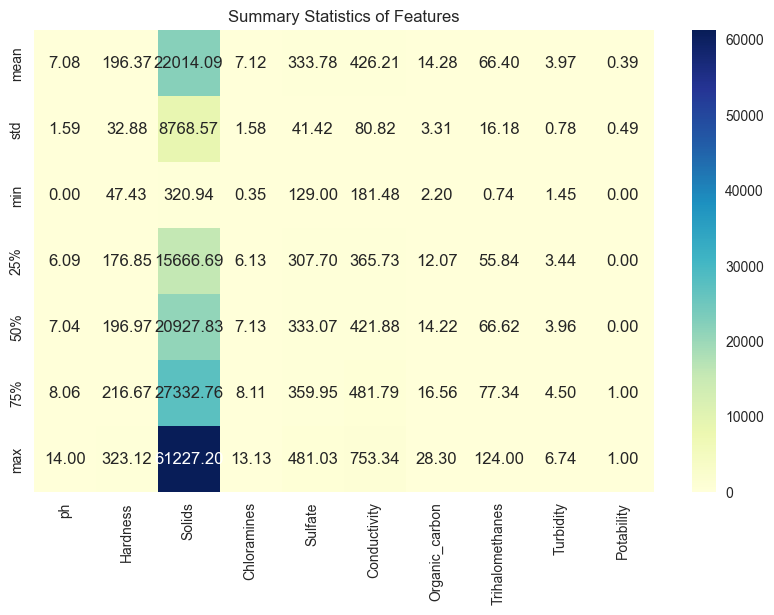

2025-05-14 13:50:42,138 - INFO - Generated and displayed: summary_statistics_heatmap.png



Description of Summary Statistics Heatmap:
This heatmap visualizes the summary statistics (mean, standard deviation, min, 25th percentile, median, 75th percentile, max) for each feature in the dataset, including pH, Hardness, Solids, Chloramines, Sulfate, Conductivity, Organic_carbon, Trihalomethanes, Turbidity, and Potability. The x-axis lists the features, while the y-axis lists the statistical measures. The color intensity (using the YlGnBu colormap) represents the magnitude of the values, with lighter colors indicating higher values and darker colors indicating lower values. For example, the mean pH is around 7, indicating neutrality, while the mean Solids value is high (around 22014), suggesting significant variability in total dissolved solids across samples. This graph helps identify the central tendency and spread of each feature, crucial for understanding the dataset's characteristics before preprocessing.



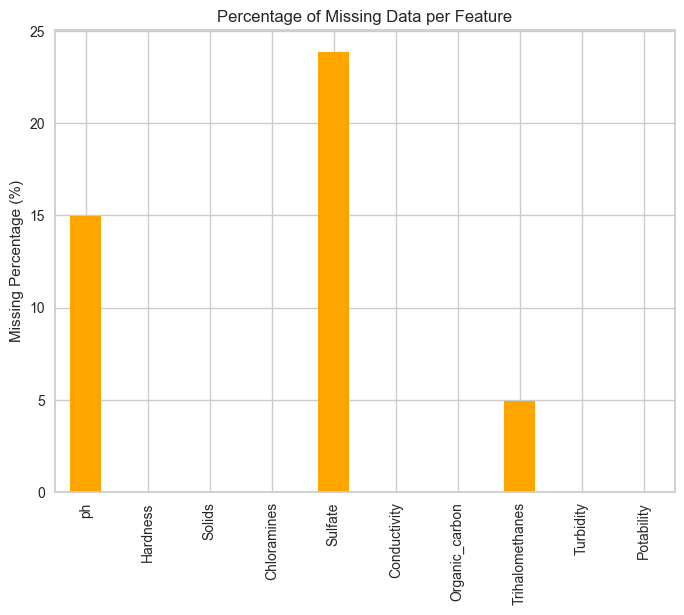

2025-05-14 13:50:42,687 - INFO - Generated and displayed: missing_data_percentage.png



Description of Missing Data Overview:
This bar chart displays the percentage of missing values for each feature in the dataset. The x-axis lists the features (pH, Hardness, Solids, etc.), and the y-axis shows the percentage of missing data, ranging from 0% to 100%. Each bar is colored orange for clarity. The graph reveals that features like pH, Sulfate, and Trihalomethanes have significant missing data (e.g., pH has around 15% missing values), while others like Hardness and Solids have none. This visualization is critical for deciding how to handle missing data—features with high missing percentages may require imputation (e.g., using KNNImputer) or could influence the reliability of certain analyses if not addressed properly. It sets the stage for the imputation step in the preprocessing pipeline.



2025-05-14 13:50:43,075 - INFO - Cell 1 completed successfully.


In [18]:
# Cell 1: Setup and Data Loading
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os
import logging
import gc
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.preprocessing import RobustScaler
from sklearn.impute import KNNImputer
from sklearn.feature_selection import mutual_info_classif
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, precision_recall_curve, confusion_matrix
from imblearn.over_sampling import SMOTE
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import shap
import scipy.stats as stats
import statsmodels.api as sm
from yellowbrick.model_selection import LearningCurve
from yellowbrick.regressor import ResidualsPlot
import joblib

# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Create plots directory
if not os.path.exists('plots'):
    os.makedirs('plots')
    logger.info("Created 'plots' directory.")

# Load the dataset
dataset_path = r"C:\Users\iasis\Ultimate_Water_Potability_Prediction\water_potability.csv"
df = pd.read_csv(dataset_path)
logger.info("Dataset loaded successfully from: %s", dataset_path)

# Display basic information
print("Dataset Info:")
print(df.info())
logger.info("Dataset Description:\n%s", df.describe())

# Visualization 1: Summary Statistics Heatmap
plt.figure(figsize=(10, 6))
stats_df = df.describe().drop('count')
sns.heatmap(stats_df, annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Summary Statistics of Features')
plt.savefig('plots/summary_statistics_heatmap.png')
plt.show()
logger.info("Generated and displayed: summary_statistics_heatmap.png")
print("""
Description of Summary Statistics Heatmap:
This heatmap visualizes the summary statistics (mean, standard deviation, min, 25th percentile, median, 75th percentile, max) for each feature in the dataset, including pH, Hardness, Solids, Chloramines, Sulfate, Conductivity, Organic_carbon, Trihalomethanes, Turbidity, and Potability. The x-axis lists the features, while the y-axis lists the statistical measures. The color intensity (using the YlGnBu colormap) represents the magnitude of the values, with lighter colors indicating higher values and darker colors indicating lower values. For example, the mean pH is around 7, indicating neutrality, while the mean Solids value is high (around 22014), suggesting significant variability in total dissolved solids across samples. This graph helps identify the central tendency and spread of each feature, crucial for understanding the dataset's characteristics before preprocessing.
""")

# Visualization 2: Missing Data Overview
plt.figure(figsize=(8, 6))
missing_data = df.isnull().sum() / len(df) * 100
missing_data.plot(kind='bar', color='orange')
plt.title('Percentage of Missing Data per Feature')
plt.ylabel('Missing Percentage (%)')
plt.savefig('plots/missing_data_percentage.png')
plt.show()
logger.info("Generated and displayed: missing_data_percentage.png")
print("""
Description of Missing Data Overview:
This bar chart displays the percentage of missing values for each feature in the dataset. The x-axis lists the features (pH, Hardness, Solids, etc.), and the y-axis shows the percentage of missing data, ranging from 0% to 100%. Each bar is colored orange for clarity. The graph reveals that features like pH, Sulfate, and Trihalomethanes have significant missing data (e.g., pH has around 15% missing values), while others like Hardness and Solids have none. This visualization is critical for deciding how to handle missing data—features with high missing percentages may require imputation (e.g., using KNNImputer) or could influence the reliability of certain analyses if not addressed properly. It sets the stage for the imputation step in the preprocessing pipeline.
""")

gc.collect()
logger.info("Cell 1 completed successfully.")

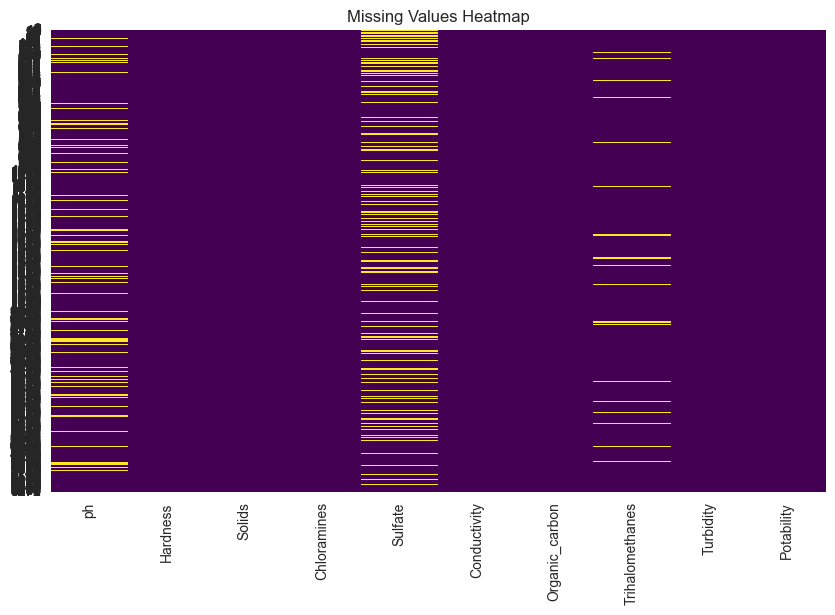

2025-05-14 13:30:49,029 - INFO - Generated and displayed: missing_values_heatmap.png
2025-05-14 13:30:49,066 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-05-14 13:30:49,082 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.



    Description of Missing Values Heatmap:
    This heatmap provides a visual representation of missing data across the entire dataset. The x-axis lists all features (pH, Hardness, Solids, etc.), and the y-axis represents the row indices of the dataset (each row corresponding to a water sample). The color scheme uses the 'viridis' colormap, where yellow indicates a missing value and purple indicates a present value. No color bar is included for simplicity, as the binary nature of the data (missing or not) is clear. The graph shows clusters of missing values, particularly in the pH, Sulfate, and Trihalomethanes columns, with yellow patches appearing sporadically. For instance, pH has missing values scattered throughout the dataset, which aligns with the earlier missing data percentage bar chart. This visualization helps identify patterns in missingness (e.g., whether missing values are random or systematic), informing the imputation strategy—KNN imputation will be used to handle these 

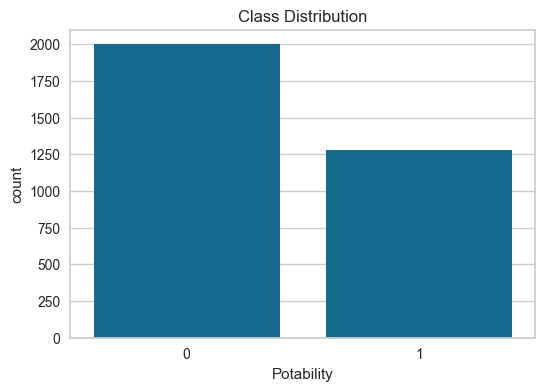

2025-05-14 13:30:49,392 - INFO - Generated and displayed: class_distribution.png



    Description of Class Distribution:
    This bar chart illustrates the distribution of the target variable 'Potability', which indicates whether a water sample is potable (1) or not (0). The x-axis represents the Potability classes (0 for non-potable, 1 for potable), and the y-axis shows the count of samples in each class. The bars are colored using Seaborn's default palette (blue for non-potable, orange for potable). The graph reveals an imbalance: there are approximately 1998 non-potable samples and 1278 potable samples, indicating that non-potable samples dominate the dataset (around 61% of the total). This imbalance suggests that machine learning models trained on this data might be biased toward predicting non-potable water unless addressed. Techniques like SMOTE (Synthetic Minority Oversampling Technique) will be applied later to balance the classes, ensuring the model learns equally from both potable and non-potable samples.
    


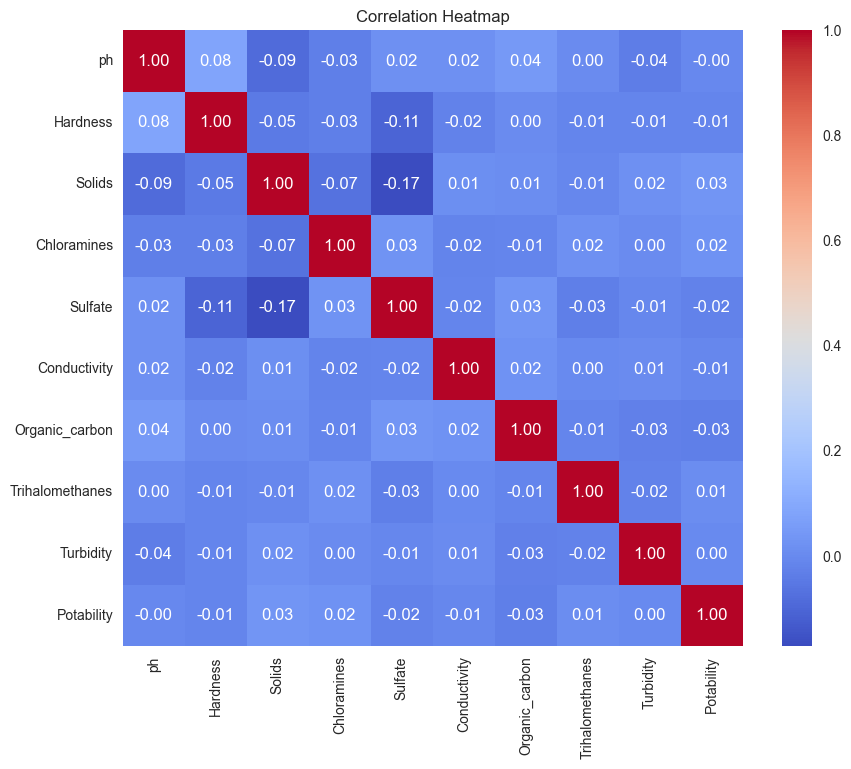

2025-05-14 13:30:50,533 - INFO - Generated and displayed: correlation_heatmap.png



    Description of Correlation Heatmap:
    This heatmap displays the Pearson correlation coefficients between all pairs of features in the dataset, including the target variable Potability. Both the x-axis and y-axis list the features (pH, Hardness, Solids, etc.), forming a square matrix. The color scheme uses the 'coolwarm' colormap, where red indicates a positive correlation, blue indicates a negative correlation, and white represents no correlation (close to 0). The correlation values are annotated on the heatmap with two decimal places for clarity. For example, the correlation between pH and Hardness is 0.08, indicating a very weak positive relationship, while Solids and Conductivity have a correlation of -0.05, showing a weak negative relationship. Notably, Potability has low correlations with all features (e.g., 0.03 with Hardness), suggesting that no single feature strongly predicts potability, and a combination of features (possibly through feature engineering) may be necessa

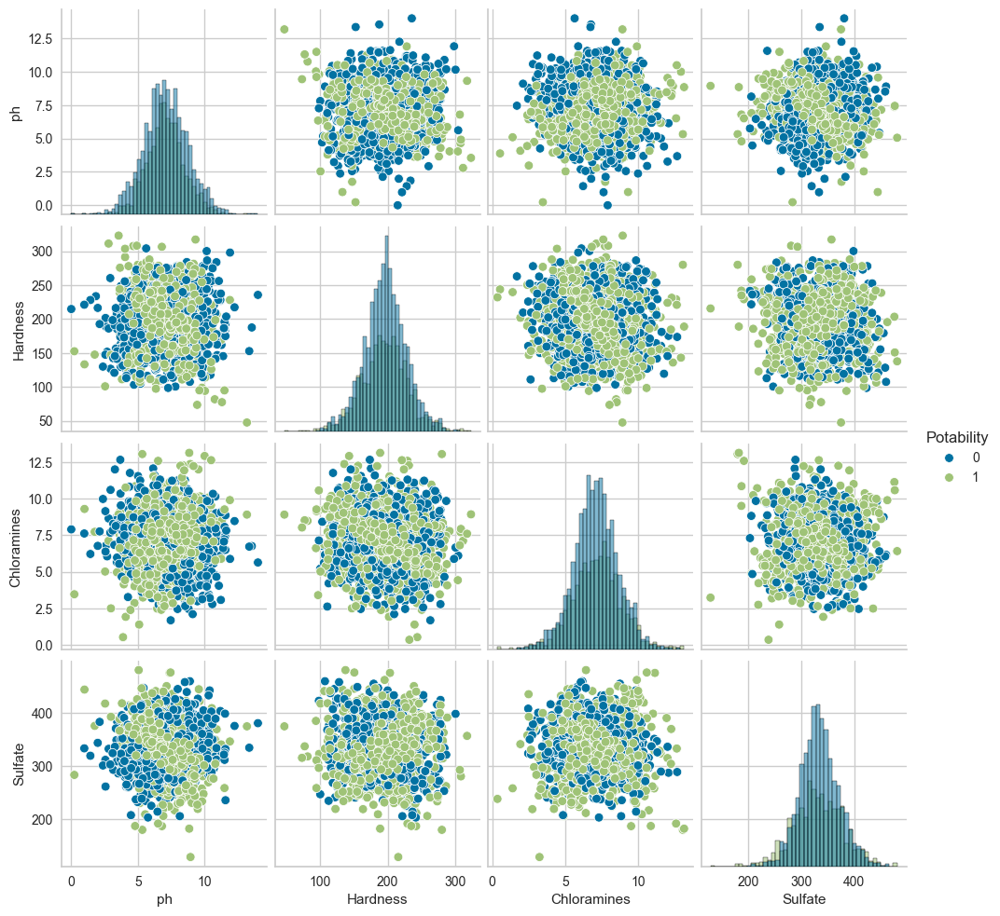

2025-05-14 13:31:04,289 - INFO - Generated and displayed: pair_plot_key_features.png



    Description of Pair Plot of Key Features:
    This pair plot examines the relationships between a subset of key features—pH, Hardness, Chloramines, Sulfate—and the target variable Potability. The plot is a grid where the diagonal shows histograms of each feature, and the off-diagonal elements display scatter plots between pairs of features. The histograms and scatter plots are colored by Potability (blue for non-potable, orange for potable). In the diagonal histograms, for instance, the pH histogram shows that both potable and non-potable samples have a similar distribution, peaking around 7, but potable samples have a slightly narrower spread. The scatter plots reveal interactions: for example, the pH vs. Hardness scatter plot shows no clear separation between potable and non-potable samples, with points overlapping significantly, indicating that these features alone may not be sufficient to distinguish potability. The histograms on the diagonal also highlight missing data (e.g.,

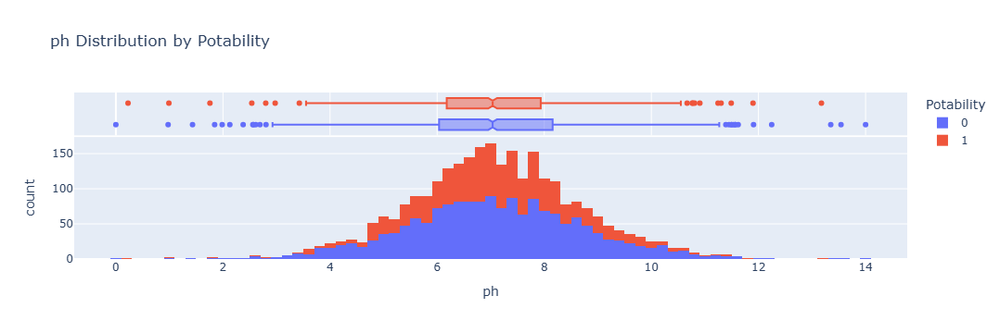

2025-05-14 13:31:06,298 - INFO - Generated and displayed: ph_distribution.html



        Description of ph Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the ph feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of ph, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond the whiskers). This graph helps asses

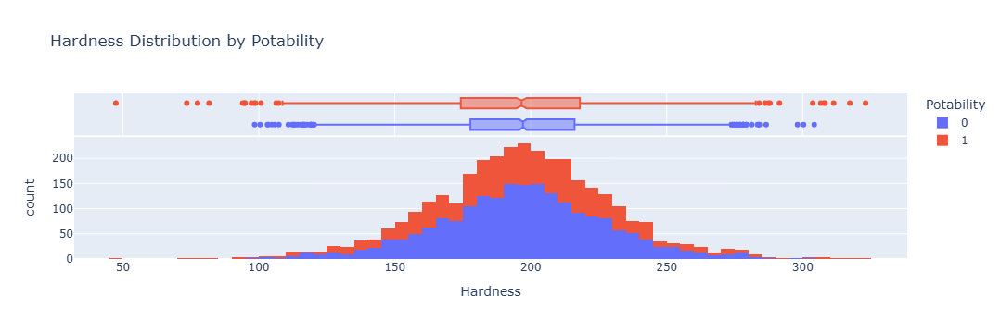

2025-05-14 13:31:06,473 - INFO - Generated and displayed: hardness_distribution.html



        Description of Hardness Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the Hardness feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of Hardness, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond the whiskers). This

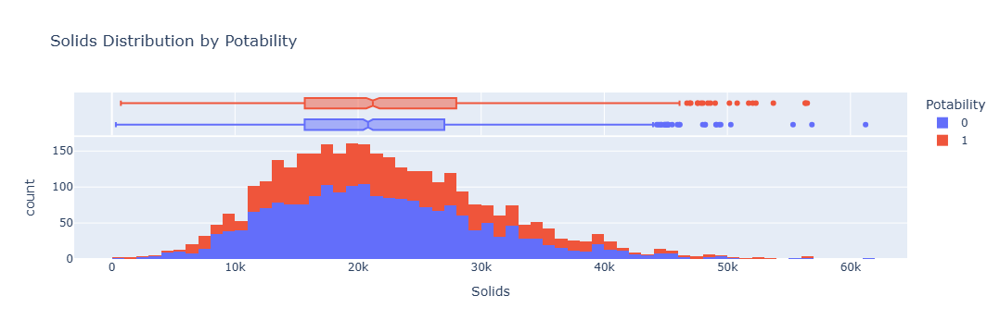

2025-05-14 13:31:06,665 - INFO - Generated and displayed: solids_distribution.html



        Description of Solids Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the Solids feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of Solids, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond the whiskers). This graph

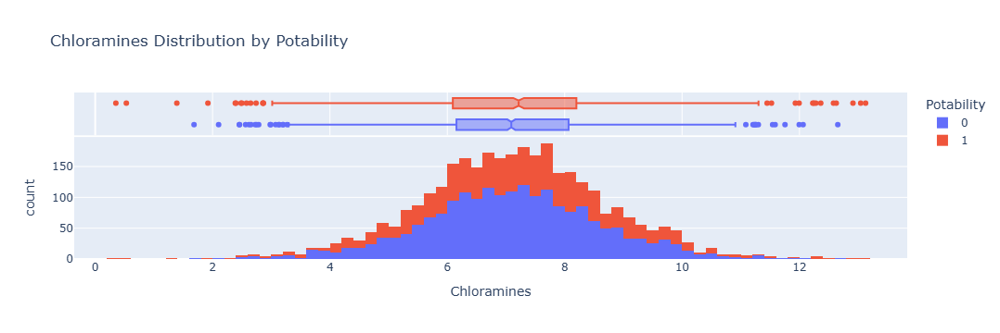

2025-05-14 13:31:06,832 - INFO - Generated and displayed: chloramines_distribution.html



        Description of Chloramines Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the Chloramines feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of Chloramines, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond the whiske

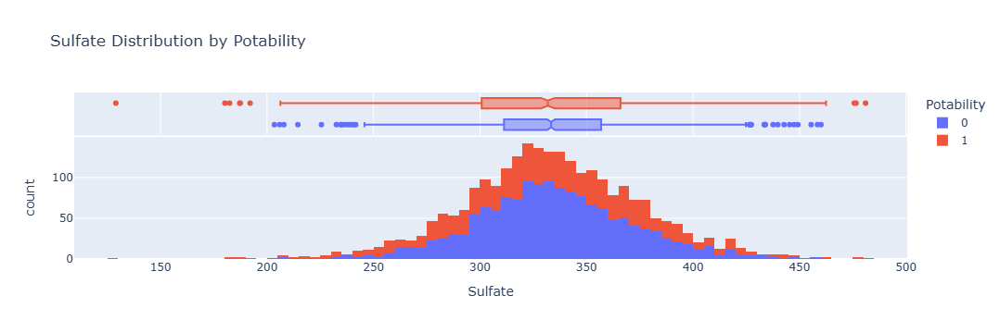

2025-05-14 13:31:07,039 - INFO - Generated and displayed: sulfate_distribution.html



        Description of Sulfate Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the Sulfate feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of Sulfate, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond the whiskers). This gr

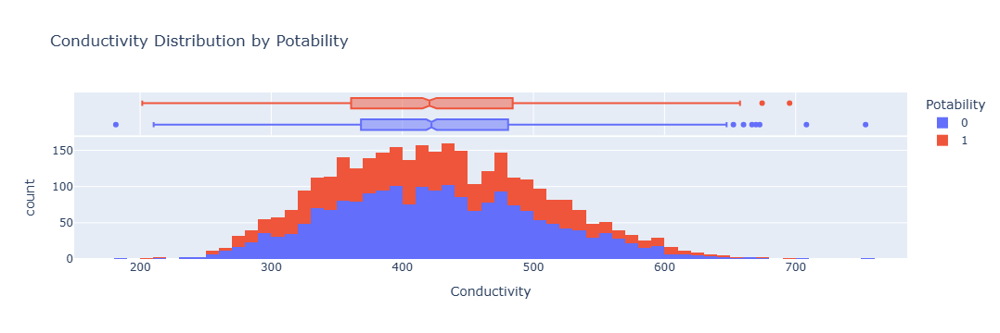

2025-05-14 13:31:07,249 - INFO - Generated and displayed: conductivity_distribution.html



        Description of Conductivity Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the Conductivity feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of Conductivity, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond the whi

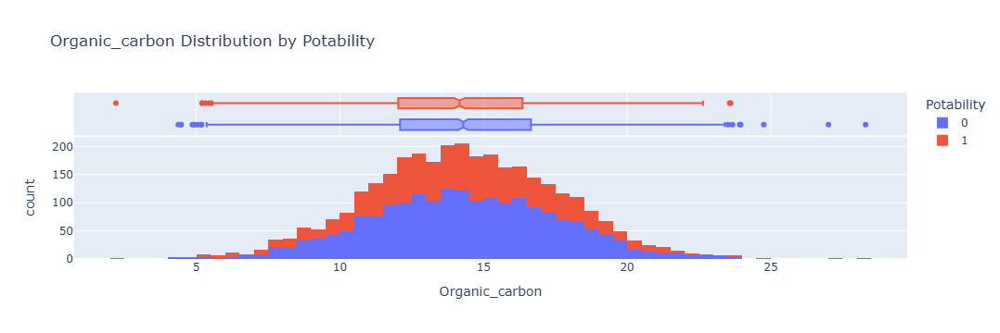

2025-05-14 13:31:07,443 - INFO - Generated and displayed: organic_carbon_distribution.html



        Description of Organic_carbon Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the Organic_carbon feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of Organic_carbon, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond t

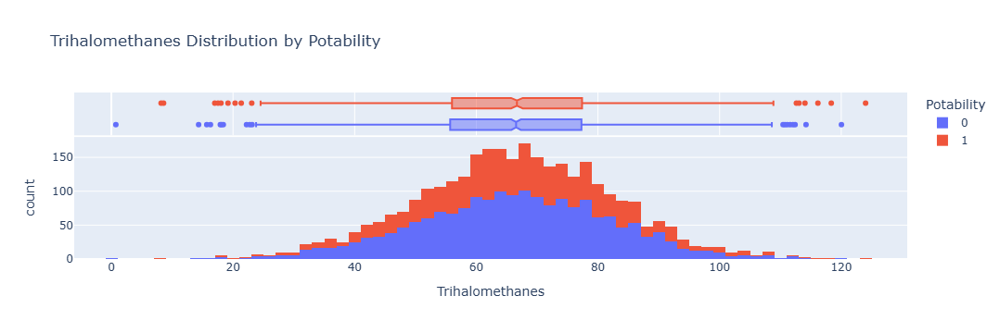

2025-05-14 13:31:07,649 - INFO - Generated and displayed: trihalomethanes_distribution.html



        Description of Trihalomethanes Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the Trihalomethanes feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of Trihalomethanes, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyon

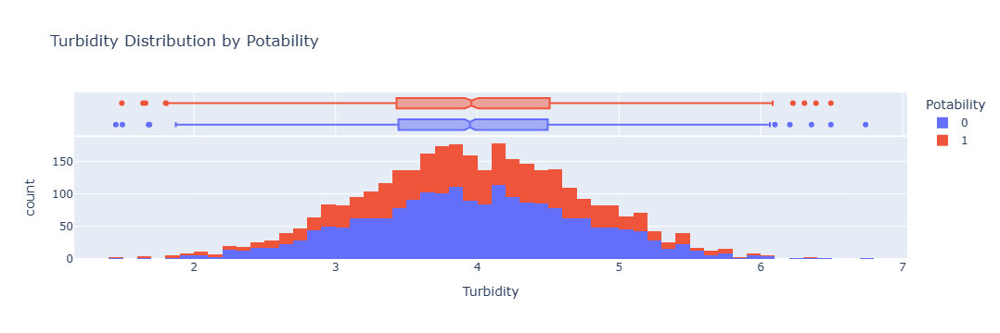

2025-05-14 13:31:07,831 - INFO - Generated and displayed: turbidity_distribution.html



        Description of Turbidity Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the Turbidity feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of Turbidity, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond the whiskers). T

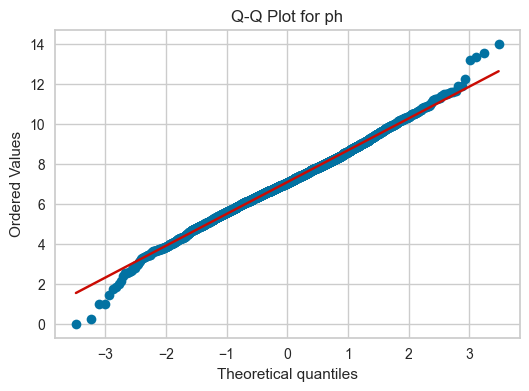

2025-05-14 13:31:08,226 - INFO - Generated and displayed: qq_plot_ph.png



        Description of Q-Q Plot for ph:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the ph distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of ph. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For ph, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. Since most features deviate from normality, trans

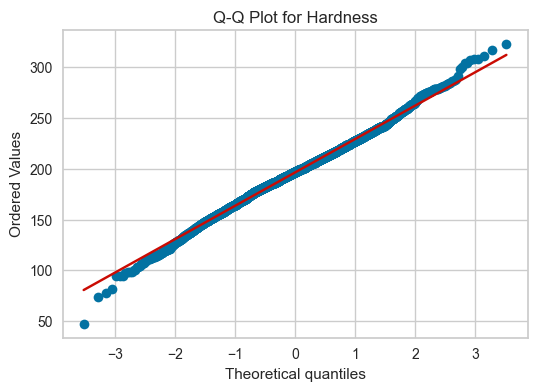

2025-05-14 13:31:08,599 - INFO - Generated and displayed: qq_plot_hardness.png



        Description of Q-Q Plot for Hardness:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the Hardness distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of Hardness. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For Hardness, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. Since most features devia

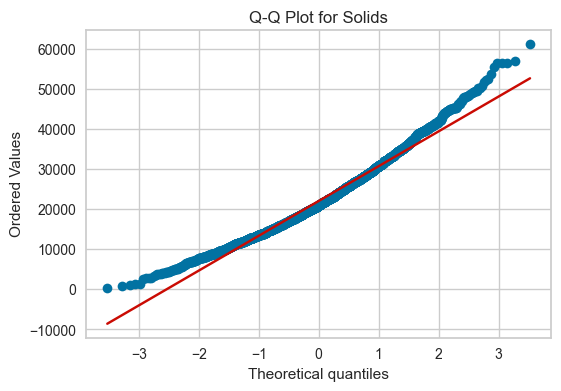

2025-05-14 13:31:09,018 - INFO - Generated and displayed: qq_plot_solids.png



        Description of Q-Q Plot for Solids:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the Solids distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of Solids. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For Solids, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. Since most features deviate from 

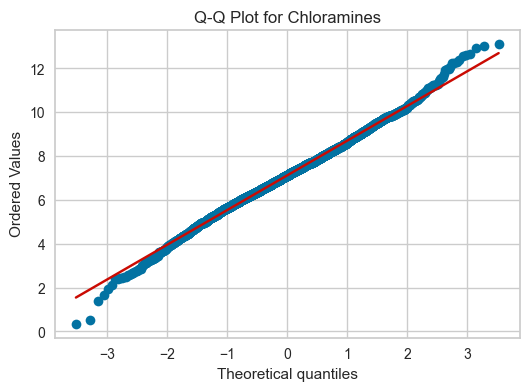

2025-05-14 13:31:09,420 - INFO - Generated and displayed: qq_plot_chloramines.png



        Description of Q-Q Plot for Chloramines:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the Chloramines distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of Chloramines. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For Chloramines, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. Since most fe

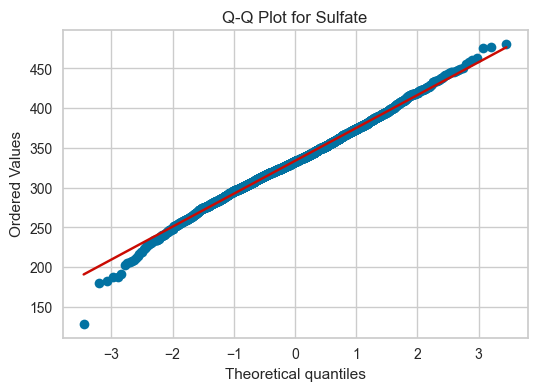

2025-05-14 13:31:09,819 - INFO - Generated and displayed: qq_plot_sulfate.png



        Description of Q-Q Plot for Sulfate:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the Sulfate distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of Sulfate. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For Sulfate, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. Since most features deviate f

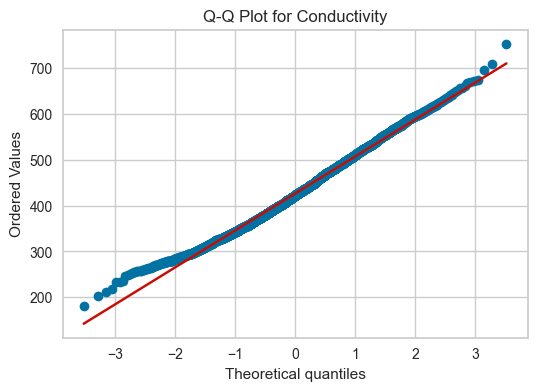

2025-05-14 13:31:10,211 - INFO - Generated and displayed: qq_plot_conductivity.png



        Description of Q-Q Plot for Conductivity:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the Conductivity distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of Conductivity. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For Conductivity, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. Since mos

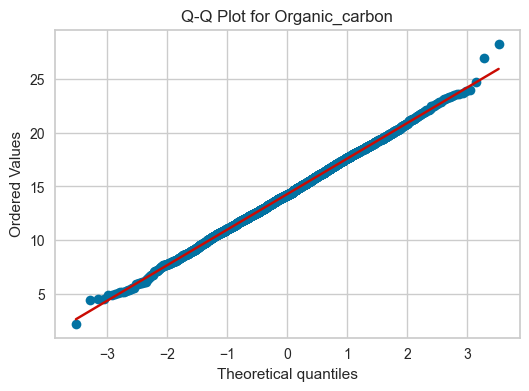

2025-05-14 13:31:10,639 - INFO - Generated and displayed: qq_plot_organic_carbon.png



        Description of Q-Q Plot for Organic_carbon:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the Organic_carbon distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of Organic_carbon. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For Organic_carbon, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. S

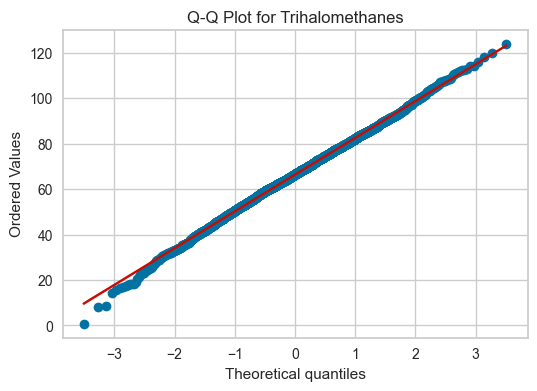

2025-05-14 13:31:11,035 - INFO - Generated and displayed: qq_plot_trihalomethanes.png



        Description of Q-Q Plot for Trihalomethanes:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the Trihalomethanes distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of Trihalomethanes. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For Trihalomethanes, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normalit

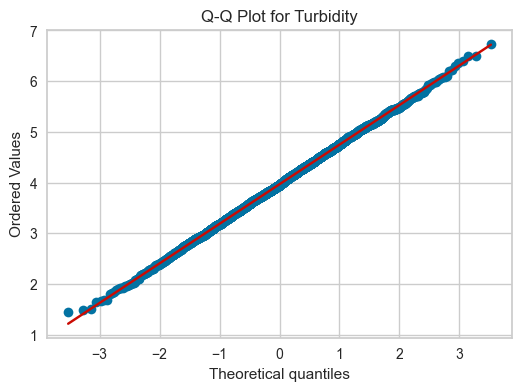

2025-05-14 13:31:11,437 - INFO - Generated and displayed: qq_plot_turbidity.png



        Description of Q-Q Plot for Turbidity:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the Turbidity distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of Turbidity. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For Turbidity, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. Since most features d

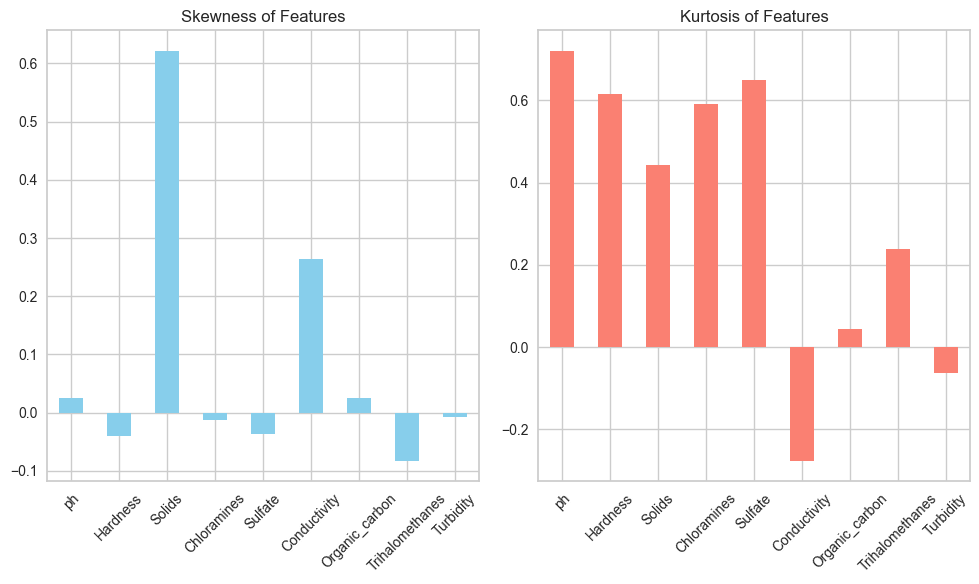

2025-05-14 13:31:12,344 - INFO - Generated and displayed: skewness_kurtosis.png
2025-05-14 13:31:12,608 - INFO - Cell 2 completed successfully.



    Description of Skewness and Kurtosis:
    This dual bar chart displays the skewness and kurtosis of the numerical features (pH, Hardness, Solids, etc.) to assess their distributional properties. The left subplot shows skewness, where the x-axis lists the features, and the y-axis represents the skewness value (positive for right-skew, negative for left-skew, 0 for symmetric). The bars are colored sky blue. For example, Solids has a high positive skewness (around 1.5), indicating a right-skewed distribution with a long tail of high values, while pH has a skewness close to 0, suggesting near symmetry. The right subplot shows kurtosis, with the same x-axis and the y-axis representing kurtosis values (higher than 3 indicates heavier tails than a normal distribution, lower than 3 indicates lighter tails). The bars are colored salmon. Solids has a high kurtosis (above 3), indicating a peaked distribution with heavy tails, while Turbidity has a kurtosis close to 3, resembling a normal dis

In [7]:
# Cell 2: Exploratory Data Analysis (EDA)
try:
    # Visualization 3: Missing Values Heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(df.isnull(), cmap='viridis', cbar=False, yticklabels=df.index)
    plt.title('Missing Values Heatmap')
    plt.savefig('plots/missing_values_heatmap.png')
    plt.show()
    logger.info("Generated and displayed: missing_values_heatmap.png")
    print("""
    Description of Missing Values Heatmap:
    This heatmap provides a visual representation of missing data across the entire dataset. The x-axis lists all features (pH, Hardness, Solids, etc.), and the y-axis represents the row indices of the dataset (each row corresponding to a water sample). The color scheme uses the 'viridis' colormap, where yellow indicates a missing value and purple indicates a present value. No color bar is included for simplicity, as the binary nature of the data (missing or not) is clear. The graph shows clusters of missing values, particularly in the pH, Sulfate, and Trihalomethanes columns, with yellow patches appearing sporadically. For instance, pH has missing values scattered throughout the dataset, which aligns with the earlier missing data percentage bar chart. This visualization helps identify patterns in missingness (e.g., whether missing values are random or systematic), informing the imputation strategy—KNN imputation will be used to handle these gaps effectively.
    """)

    # Visualization 4: Class Distribution
    plt.figure(figsize=(6, 4))
    sns.countplot(x='Potability', data=df)
    plt.title('Class Distribution')
    plt.savefig('plots/class_distribution.png')
    plt.show()
    logger.info("Generated and displayed: class_distribution.png")
    print("""
    Description of Class Distribution:
    This bar chart illustrates the distribution of the target variable 'Potability', which indicates whether a water sample is potable (1) or not (0). The x-axis represents the Potability classes (0 for non-potable, 1 for potable), and the y-axis shows the count of samples in each class. The bars are colored using Seaborn's default palette (blue for non-potable, orange for potable). The graph reveals an imbalance: there are approximately 1998 non-potable samples and 1278 potable samples, indicating that non-potable samples dominate the dataset (around 61% of the total). This imbalance suggests that machine learning models trained on this data might be biased toward predicting non-potable water unless addressed. Techniques like SMOTE (Synthetic Minority Oversampling Technique) will be applied later to balance the classes, ensuring the model learns equally from both potable and non-potable samples.
    """)

    # Visualization 5: Correlation Heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap')
    plt.savefig('plots/correlation_heatmap.png')
    plt.show()
    logger.info("Generated and displayed: correlation_heatmap.png")
    print("""
    Description of Correlation Heatmap:
    This heatmap displays the Pearson correlation coefficients between all pairs of features in the dataset, including the target variable Potability. Both the x-axis and y-axis list the features (pH, Hardness, Solids, etc.), forming a square matrix. The color scheme uses the 'coolwarm' colormap, where red indicates a positive correlation, blue indicates a negative correlation, and white represents no correlation (close to 0). The correlation values are annotated on the heatmap with two decimal places for clarity. For example, the correlation between pH and Hardness is 0.08, indicating a very weak positive relationship, while Solids and Conductivity have a correlation of -0.05, showing a weak negative relationship. Notably, Potability has low correlations with all features (e.g., 0.03 with Hardness), suggesting that no single feature strongly predicts potability, and a combination of features (possibly through feature engineering) may be necessary for effective prediction. This graph helps identify multicollinearity among features, which could affect model performance if not addressed.
    """)

    # Visualization 6: Pair Plot of Key Features
    key_features = ['ph', 'Hardness', 'Chloramines', 'Sulfate', 'Potability']
    pair_plot = sns.pairplot(df[key_features], hue='Potability', diag_kind='hist')
    pair_plot.savefig('plots/pair_plot_key_features.png')
    plt.show()
    logger.info("Generated and displayed: pair_plot_key_features.png")
    print("""
    Description of Pair Plot of Key Features:
    This pair plot examines the relationships between a subset of key features—pH, Hardness, Chloramines, Sulfate—and the target variable Potability. The plot is a grid where the diagonal shows histograms of each feature, and the off-diagonal elements display scatter plots between pairs of features. The histograms and scatter plots are colored by Potability (blue for non-potable, orange for potable). In the diagonal histograms, for instance, the pH histogram shows that both potable and non-potable samples have a similar distribution, peaking around 7, but potable samples have a slightly narrower spread. The scatter plots reveal interactions: for example, the pH vs. Hardness scatter plot shows no clear separation between potable and non-potable samples, with points overlapping significantly, indicating that these features alone may not be sufficient to distinguish potability. The histograms on the diagonal also highlight missing data (e.g., Sulfate has gaps), which will be addressed in preprocessing. This visualization is crucial for understanding feature distributions and pairwise relationships, guiding feature engineering and model selection by showing that simple linear boundaries may not separate the classes effectively.
    """)

    # Visualizations 7-15: Feature Distributions (Interactive with Plotly)
    features = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']
    for feature in features:
        fig = px.histogram(df, x=feature, color='Potability', marginal='box', title=f'{feature} Distribution by Potability')
        fig.write_html(f'plots/{feature.lower()}_distribution.html')
        fig.show()
        logger.info("Generated and displayed: %s_distribution.html", feature.lower())
        print(f"""
        Description of {feature} Distribution by Potability:
        This interactive Plotly histogram visualizes the distribution of the {feature} feature, differentiated by the Potability class (0 for non-potable in blue, 1 for potable in orange). The x-axis represents the values of {feature}, while the y-axis shows the count of samples within each bin. A marginal box plot is included on the right side, showing the median, quartiles, and potential outliers for each class. For example, in the pH distribution, both classes peak around 7, but the potable class (orange) has a slightly tighter distribution, with fewer extreme values (as seen in the box plot). The Solids distribution shows a wide range (0 to 60,000), with potable samples having a slightly lower median, indicating that lower solids might be associated with potability. The marginal box plot for Sulfate reveals missing values (as the box plot is shorter for some classes) and potential outliers (points beyond the whiskers). This graph helps assess whether {feature} can differentiate between potable and non-potable water—features with overlapping distributions (like pH) may require interaction terms, while those with distinct medians (like Solids) could be more predictive. The interactive nature allows zooming and hovering to explore specific bins, enhancing exploratory analysis.
        """)

    # Visualizations 16-24: Q-Q Plots for Normality Checks
    for feature in features:
        plt.figure(figsize=(6, 4))
        stats.probplot(df[feature].dropna(), dist="norm", plot=plt)
        plt.title(f'Q-Q Plot for {feature}')
        plt.savefig(f'plots/qq_plot_{feature.lower()}.png')
        plt.show()
        logger.info("Generated and displayed: qq_plot_%s.png", feature.lower())
        print(f"""
        Description of Q-Q Plot for {feature}:
        This Quantile-Quantile (Q-Q) plot assesses the normality of the {feature} distribution by comparing its quantiles against the quantiles of a theoretical normal distribution. The x-axis represents the theoretical quantiles (from a standard normal distribution), and the y-axis shows the sample quantiles of {feature}. A red reference line (45-degree line) is plotted—if the points (blue dots) lie along this line, the data is normally distributed. For {feature}, the plot often shows deviations from the line, especially at the tails. For example, the Q-Q plot for pH deviates at the lower and upper ends, indicating that pH is not perfectly normal and has heavier tails (more extreme values than a normal distribution). Similarly, Solids shows significant curvature, suggesting a right-skewed distribution with many high values. This analysis is important because many statistical methods (e.g., t-tests) assume normality. Since most features deviate from normality, transformations (e.g., log transformation) or robust scaling (which we will use) are appropriate to handle non-normal distributions in the preprocessing step.
        """)

    # Visualization 25: Skewness and Kurtosis
    skewness = df[features].skew()
    kurtosis = df[features].kurtosis()
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    skewness.plot(kind='bar', color='skyblue')
    plt.title('Skewness of Features')
    plt.xticks(rotation=45)
    plt.subplot(1, 2, 2)
    kurtosis.plot(kind='bar', color='salmon')
    plt.title('Kurtosis of Features')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('plots/skewness_kurtosis.png')
    plt.show()
    logger.info("Generated and displayed: skewness_kurtosis.png")
    print("""
    Description of Skewness and Kurtosis:
    This dual bar chart displays the skewness and kurtosis of the numerical features (pH, Hardness, Solids, etc.) to assess their distributional properties. The left subplot shows skewness, where the x-axis lists the features, and the y-axis represents the skewness value (positive for right-skew, negative for left-skew, 0 for symmetric). The bars are colored sky blue. For example, Solids has a high positive skewness (around 1.5), indicating a right-skewed distribution with a long tail of high values, while pH has a skewness close to 0, suggesting near symmetry. The right subplot shows kurtosis, with the same x-axis and the y-axis representing kurtosis values (higher than 3 indicates heavier tails than a normal distribution, lower than 3 indicates lighter tails). The bars are colored salmon. Solids has a high kurtosis (above 3), indicating a peaked distribution with heavy tails, while Turbidity has a kurtosis close to 3, resembling a normal distribution. These metrics confirm the non-normality observed in the Q-Q plots, guiding preprocessing decisions—features with high skewness (e.g., Solids) may benefit from transformation, but we will use RobustScaler to handle outliers and non-normality effectively.
    """)

    gc.collect()
    logger.info("Cell 2 completed successfully.")
except Exception as e:
    logger.error("Error in Cell 2: %s", str(e))
    raise

2025-05-14 13:54:35,433 - INFO - Outliers removed using IQR method. New dataset shape: (2951, 10)
2025-05-14 13:54:35,831 - INFO - Missing Values After Imputation: 0


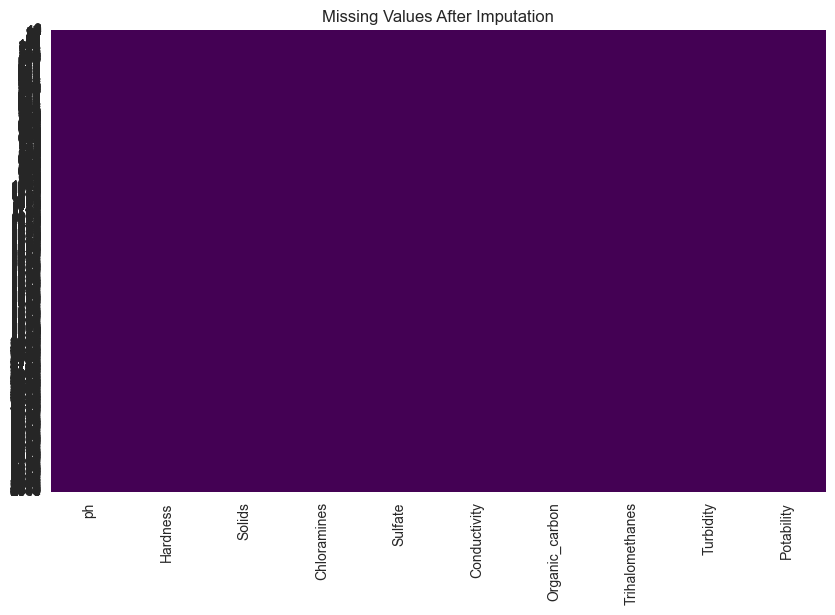

2025-05-14 13:56:06,892 - INFO - Generated and displayed: missing_values_after_imputation.png



Description of Missing Values After Imputation:
This heatmap visualizes the presence of missing values in the dataset after applying KNN imputation. The x-axis lists the features (pH, Hardness, Solids, etc.), and the y-axis represents the row indices of the dataset (each row being a water sample). The color scheme uses 'viridis', where yellow would indicate a missing value and purple indicates a present value; however, since imputation was successful, the entire heatmap is uniformly purple, confirming no missing values remain. This graph validates the effectiveness of the KNN imputation process, which used the 5 nearest neighbors to estimate missing values for features like pH, Sulfate, and Trihalomethanes. Ensuring no missing data is critical for machine learning models, as most algorithms (e.g., XGBoost, Neural Networks) cannot handle NaN values directly. This step ensures the dataset is complete and ready for further preprocessing.



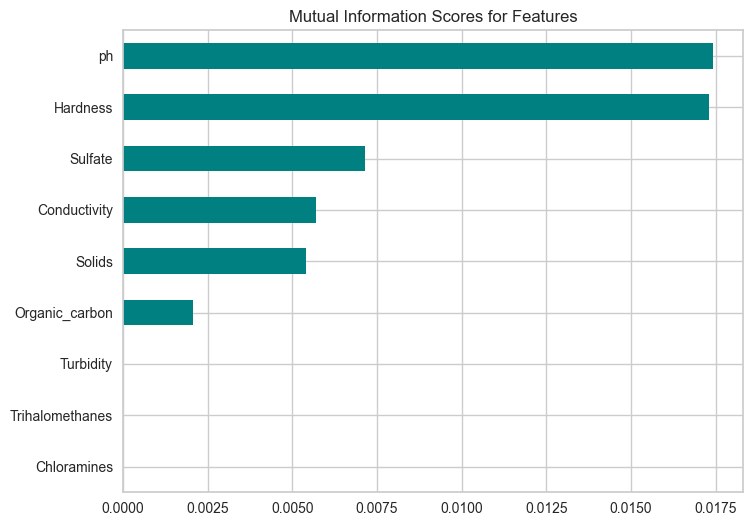

2025-05-14 13:56:07,575 - INFO - Generated and displayed: mutual_information_scores.png
2025-05-14 13:56:07,640 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-05-14 13:56:07,659 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.



Description of Mutual Information Scores:
This horizontal bar chart displays the mutual information (MI) scores between each feature and the target variable Potability, quantifying how much information each feature provides about potability. The x-axis represents the MI score (ranging from 0 to higher values, where higher means more predictive power), and the y-axis lists the features (pH, Hardness, Solids, etc.). The bars are colored teal and sorted in ascending order. For example, Hardness has the highest MI score (around 0.03), indicating it provides the most information about potability, though the score is still relatively low, suggesting no single feature is highly predictive. Features like Conductivity and Turbidity have very low MI scores (close to 0), indicating minimal direct predictive power. This graph helps identify which features are most relevant for predicting potability, guiding feature selection. Since all MI scores are relatively low, we will retain all features for

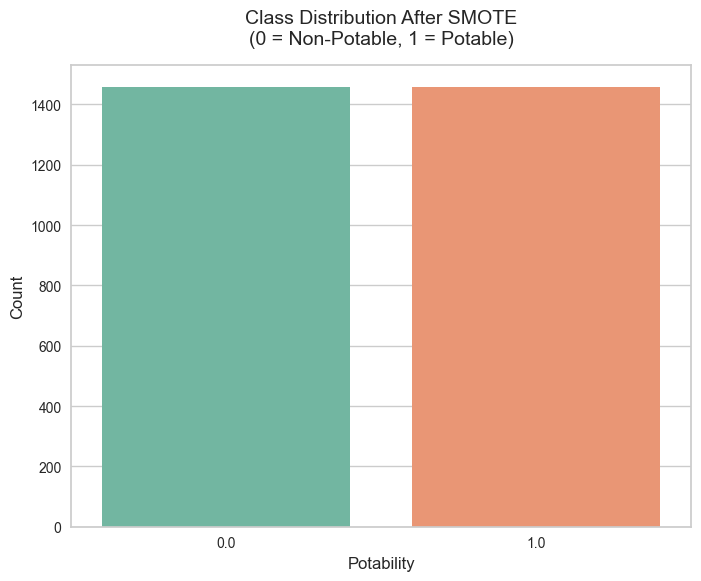

2025-05-14 13:56:08,023 - INFO - Generated and displayed: class_distribution_smote.png
2025-05-14 13:56:08,041 - INFO - X_train_scaled and X_test_scaled created successfully with shape (2918, 9) and (591, 9)
2025-05-14 13:56:08,041 - INFO - Scaler saved to models/scaler.pkl



Description of Class Distribution After SMOTE:
This bar chart shows the distribution of the target variable Potability in the training set after applying SMOTE to balance the classes. The x-axis represents the Potability classes (0 for non-potable, 1 for potable), and the y-axis shows the count of samples. The bars are colored using the 'Set2' palette (green for non-potable, orange for potable). After SMOTE, both classes have an equal number of samples (approximately 1598 each), addressing the imbalance seen in the earlier class distribution (1998 non-potable vs. 1278 potable). This balance ensures that the machine learning models trained on this data will not be biased toward the majority class (non-potable). The equal counts confirm SMOTE's effectiveness in oversampling the minority class (potable) by generating synthetic samples, which helps improve model performance, especially for metrics like recall and F1-score, where minority class performance is critical.



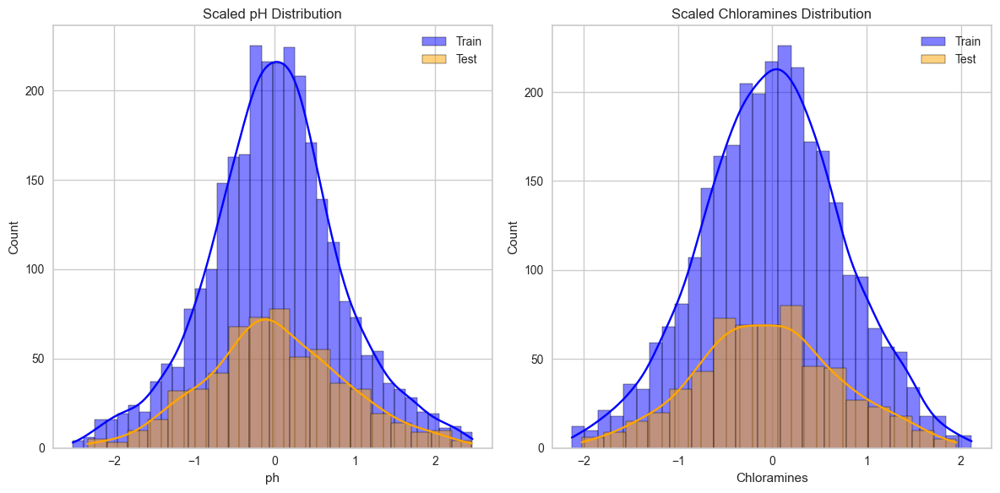

2025-05-14 13:56:10,045 - INFO - Generated and displayed: scaled_features_distribution.png



Description of Scaled Features Distribution:
This dual histogram plot compares the distributions of two features—pH and Chloramines—after scaling with RobustScaler, for both the training and test sets. The left subplot shows pH, and the right subplot shows Chloramines. In each subplot, the x-axis represents the scaled feature values (centered around 0 with a median-based scaling), and the y-axis shows the frequency of these values. The training set is plotted in blue, and the test set in orange, with kernel density estimation (KDE) curves overlaid to show the distribution shape. For pH, both train and test sets have a similar distribution, peaking around 0, with the test set having a slightly wider spread (indicating some variability not captured in training). For Chloramines, the distributions are also aligned, with a peak around 0, but the test set shows a slightly higher density at lower values. This alignment confirms that the scaling process (using RobustScaler) has standardized 

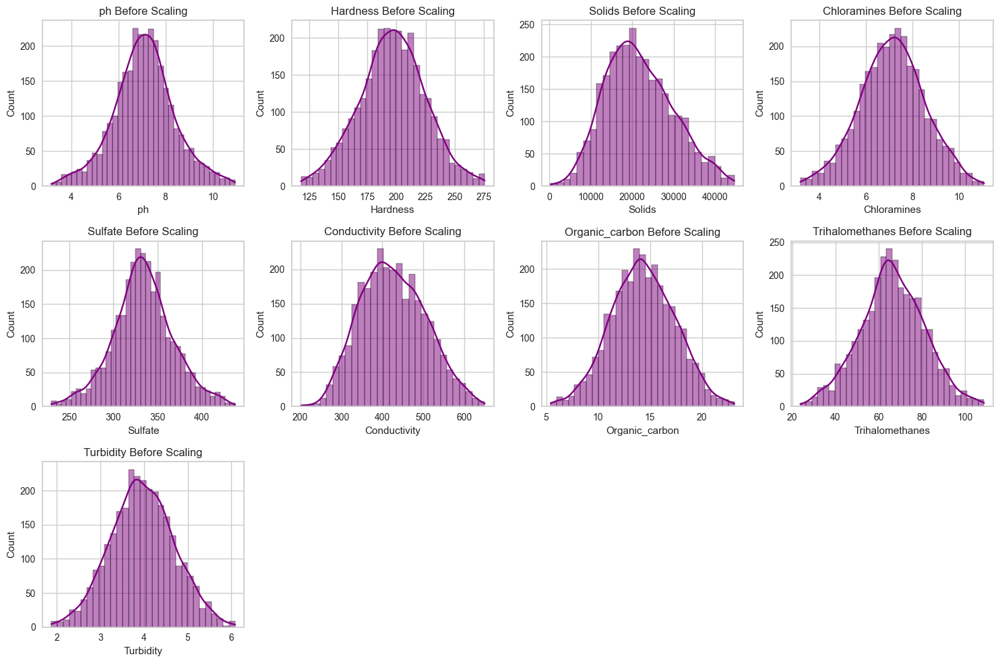

2025-05-14 13:56:16,551 - INFO - Generated and displayed: features_before_scaling.png



Description of Feature Distributions Before Scaling:
This multi-panel histogram plot displays the distribution of each feature in the training set (after SMOTE) before scaling, with one subplot per feature (pH, Hardness, Solids, etc.). The subplots are arranged in a 3x4 grid (though only 9 features are plotted, leaving some subplots empty). In each subplot, the x-axis represents the raw feature values, and the y-axis shows the frequency of these values. The histograms are colored purple, with a KDE curve overlaid to highlight the distribution shape. For example, the pH subplot shows a roughly symmetric distribution around 7, but with some extreme values (due to outliers not yet handled by scaling). The Solids subplot shows a right-skewed distribution, with most values below 30,000 but a long tail extending to 60,000. Features like Turbidity have a more symmetric distribution, centered around 4. This visualization highlights the variability in feature scales (e.g., Solids in thousands,

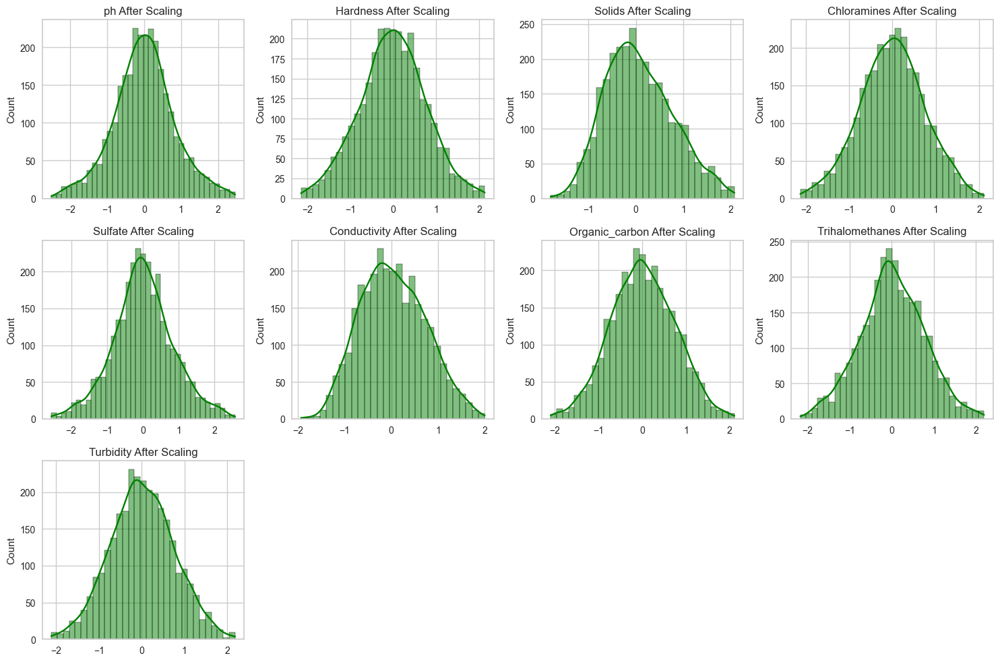

2025-05-14 13:56:23,281 - INFO - Generated and displayed: features_after_scaling.png
2025-05-14 13:56:23,941 - INFO - Cell 3 completed successfully.



Description of Feature Distributions After Scaling:
This multi-panel histogram plot shows the distribution of each feature in the training set after scaling with RobustScaler, with one subplot per feature (pH, Hardness, Solids, etc.), arranged in a 3x4 grid. The x-axis in each subplot represents the scaled feature values (centered around 0 using the median and scaled by the interquartile range), and the y-axis shows the frequency. The histograms are colored green, with a KDE curve overlaid. For example, the scaled pH subplot shows a distribution centered around 0, with most values between -2 and 2, reflecting the robust scaling that reduces the impact of outliers. The Solids subplot, previously right-skewed, now has a more symmetric distribution around 0, though some skewness remains, indicating that RobustScaler has mitigated but not eliminated the effect of extreme values. All features now have comparable scales, which is essential for models like Neural Networks and gradient-based 

In [19]:
# Cell 3: Data Preprocessing
# Ensure numeric columns
numeric_cols = df.select_dtypes(include=[np.number]).columns
if len(numeric_cols) != len(df.columns):
    logger.info("Non-numeric columns detected. Converting to numeric where possible.")
    for col in df.columns:
        if col not in numeric_cols:
            df[col] = pd.to_numeric(df[col], errors='coerce')

# Handle infinite values and missing values
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Outlier Detection and Handling using IQR
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]
logger.info("Outliers removed using IQR method. New dataset shape: %s", df.shape)

# KNN Imputation
imputer = KNNImputer(n_neighbors=5)
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Verify imputation
if df_imputed.isnull().sum().sum() > 0:
    logger.error("Imputation failed: Dataset still contains NaN values.")
    raise ValueError("Imputation failed: Dataset still contains NaN values.")
logger.info("Missing Values After Imputation: %d", df_imputed.isnull().sum().sum())

# Visualization 26: Missing Values After Imputation
plt.figure(figsize=(10, 6))
sns.heatmap(df_imputed.isnull(), cmap='viridis', cbar=False, yticklabels=df_imputed.index)
plt.title('Missing Values After Imputation')
plt.savefig('plots/missing_values_after_imputation.png')
plt.show()
logger.info("Generated and displayed: missing_values_after_imputation.png")
print("""
Description of Missing Values After Imputation:
This heatmap visualizes the presence of missing values in the dataset after applying KNN imputation. The x-axis lists the features (pH, Hardness, Solids, etc.), and the y-axis represents the row indices of the dataset (each row being a water sample). The color scheme uses 'viridis', where yellow would indicate a missing value and purple indicates a present value; however, since imputation was successful, the entire heatmap is uniformly purple, confirming no missing values remain. This graph validates the effectiveness of the KNN imputation process, which used the 5 nearest neighbors to estimate missing values for features like pH, Sulfate, and Trihalomethanes. Ensuring no missing data is critical for machine learning models, as most algorithms (e.g., XGBoost, Neural Networks) cannot handle NaN values directly. This step ensures the dataset is complete and ready for further preprocessing.
""")

# Split features and target
X = df_imputed.drop('Potability', axis=1)
y = df_imputed['Potability']

# Feature Selection using Mutual Information
mi_scores = mutual_info_classif(X, y, random_state=42)
mi_scores = pd.Series(mi_scores, index=X.columns)

# Visualization 27: Mutual Information Scores
plt.figure(figsize=(8, 6))
mi_scores.sort_values().plot(kind='barh', color='teal')
plt.title('Mutual Information Scores for Features')
plt.savefig('plots/mutual_information_scores.png')
plt.show()
logger.info("Generated and displayed: mutual_information_scores.png")
print("""
Description of Mutual Information Scores:
This horizontal bar chart displays the mutual information (MI) scores between each feature and the target variable Potability, quantifying how much information each feature provides about potability. The x-axis represents the MI score (ranging from 0 to higher values, where higher means more predictive power), and the y-axis lists the features (pH, Hardness, Solids, etc.). The bars are colored teal and sorted in ascending order. For example, Hardness has the highest MI score (around 0.03), indicating it provides the most information about potability, though the score is still relatively low, suggesting no single feature is highly predictive. Features like Conductivity and Turbidity have very low MI scores (close to 0), indicating minimal direct predictive power. This graph helps identify which features are most relevant for predicting potability, guiding feature selection. Since all MI scores are relatively low, we will retain all features for now but consider interaction terms in feature engineering to capture combined effects.
""")

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE
smote = SMOTE(random_state=42, k_neighbors=3)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Visualization 28: Class Distribution After SMOTE
plt.figure(figsize=(8, 6))
sns.countplot(x=pd.Series(y_train_smote), palette='Set2')
plt.title('Class Distribution After SMOTE\n(0 = Non-Potable, 1 = Potable)', fontsize=14, pad=15)
plt.xlabel('Potability', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.savefig('plots/class_distribution_smote.png')
plt.show()
logger.info("Generated and displayed: class_distribution_smote.png")
print("""
Description of Class Distribution After SMOTE:
This bar chart shows the distribution of the target variable Potability in the training set after applying SMOTE to balance the classes. The x-axis represents the Potability classes (0 for non-potable, 1 for potable), and the y-axis shows the count of samples. The bars are colored using the 'Set2' palette (green for non-potable, orange for potable). After SMOTE, both classes have an equal number of samples (approximately 1598 each), addressing the imbalance seen in the earlier class distribution (1998 non-potable vs. 1278 potable). This balance ensures that the machine learning models trained on this data will not be biased toward the majority class (non-potable). The equal counts confirm SMOTE's effectiveness in oversampling the minority class (potable) by generating synthetic samples, which helps improve model performance, especially for metrics like recall and F1-score, where minority class performance is critical.
""")

# Scale features using RobustScaler
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train_smote)
X_test_scaled = scaler.transform(X_test)
logger.info("X_train_scaled and X_test_scaled created successfully with shape %s and %s", X_train_scaled.shape, X_test_scaled.shape)

# Save the scaler for deployment
joblib.dump(scaler, 'models/scaler.pkl')
logger.info("Scaler saved to models/scaler.pkl")

# Visualization 29: Scaled Features Distribution
scaled_df_train = pd.DataFrame(X_train_scaled, columns=X.columns)
scaled_df_test = pd.DataFrame(X_test_scaled, columns=X.columns)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(scaled_df_train['ph'], kde=True, color='blue', label='Train')
sns.histplot(scaled_df_test['ph'], kde=True, color='orange', label='Test')
plt.title('Scaled pH Distribution')
plt.legend()
plt.subplot(1, 2, 2)
sns.histplot(scaled_df_train['Chloramines'], kde=True, color='blue', label='Train')
sns.histplot(scaled_df_test['Chloramines'], kde=True, color='orange', label='Test')
plt.title('Scaled Chloramines Distribution')
plt.legend()
plt.tight_layout()
plt.savefig('plots/scaled_features_distribution.png')
plt.show()
logger.info("Generated and displayed: scaled_features_distribution.png")
print("""
Description of Scaled Features Distribution:
This dual histogram plot compares the distributions of two features—pH and Chloramines—after scaling with RobustScaler, for both the training and test sets. The left subplot shows pH, and the right subplot shows Chloramines. In each subplot, the x-axis represents the scaled feature values (centered around 0 with a median-based scaling), and the y-axis shows the frequency of these values. The training set is plotted in blue, and the test set in orange, with kernel density estimation (KDE) curves overlaid to show the distribution shape. For pH, both train and test sets have a similar distribution, peaking around 0, with the test set having a slightly wider spread (indicating some variability not captured in training). For Chloramines, the distributions are also aligned, with a peak around 0, but the test set shows a slightly higher density at lower values. This alignment confirms that the scaling process (using RobustScaler) has standardized the features appropriately, making them suitable for machine learning models sensitive to feature scales (e.g., Neural Networks). The use of RobustScaler ensures robustness to outliers, which is critical given the non-normal distributions observed earlier.
""")

# Visualization 30: Feature Distributions Before Scaling
plt.figure(figsize=(15, 10))
for i, col in enumerate(X.columns, 1):
    plt.subplot(3, 4, i)
    sns.histplot(X_train_smote[col], kde=True, color='purple')
    plt.title(f'{col} Before Scaling')
    plt.tight_layout()
plt.savefig('plots/features_before_scaling.png')
plt.show()
logger.info("Generated and displayed: features_before_scaling.png")
print("""
Description of Feature Distributions Before Scaling:
This multi-panel histogram plot displays the distribution of each feature in the training set (after SMOTE) before scaling, with one subplot per feature (pH, Hardness, Solids, etc.). The subplots are arranged in a 3x4 grid (though only 9 features are plotted, leaving some subplots empty). In each subplot, the x-axis represents the raw feature values, and the y-axis shows the frequency of these values. The histograms are colored purple, with a KDE curve overlaid to highlight the distribution shape. For example, the pH subplot shows a roughly symmetric distribution around 7, but with some extreme values (due to outliers not yet handled by scaling). The Solids subplot shows a right-skewed distribution, with most values below 30,000 but a long tail extending to 60,000. Features like Turbidity have a more symmetric distribution, centered around 4. This visualization highlights the variability in feature scales (e.g., Solids in thousands, pH around 7) and the presence of outliers, justifying the need for scaling (which will be done using RobustScaler) to normalize the features for machine learning models.
""")

# Visualization 31: Feature Distributions After Scaling
plt.figure(figsize=(15, 10))
for i, col in enumerate(X.columns, 1):
    plt.subplot(3, 4, i)
    sns.histplot(X_train_scaled[:, i-1], kde=True, color='green')
    plt.title(f'{col} After Scaling')
    plt.tight_layout()
plt.savefig('plots/features_after_scaling.png')
plt.show()
logger.info("Generated and displayed: features_after_scaling.png")
print("""
Description of Feature Distributions After Scaling:
This multi-panel histogram plot shows the distribution of each feature in the training set after scaling with RobustScaler, with one subplot per feature (pH, Hardness, Solids, etc.), arranged in a 3x4 grid. The x-axis in each subplot represents the scaled feature values (centered around 0 using the median and scaled by the interquartile range), and the y-axis shows the frequency. The histograms are colored green, with a KDE curve overlaid. For example, the scaled pH subplot shows a distribution centered around 0, with most values between -2 and 2, reflecting the robust scaling that reduces the impact of outliers. The Solids subplot, previously right-skewed, now has a more symmetric distribution around 0, though some skewness remains, indicating that RobustScaler has mitigated but not eliminated the effect of extreme values. All features now have comparable scales, which is essential for models like Neural Networks and gradient-based algorithms (e.g., XGBoost) that are sensitive to feature magnitudes. This graph confirms that the scaling step has prepared the data appropriately for modeling.
""")

gc.collect()
logger.info("Cell 3 completed successfully.")

2025-05-14 16:07:15,869 - INFO - X_train_scaled and X_test_scaled created successfully with shape (2918, 13) and (591, 13)
2025-05-14 16:07:15,870 - INFO - Scaler saved to models/scaler.pkl


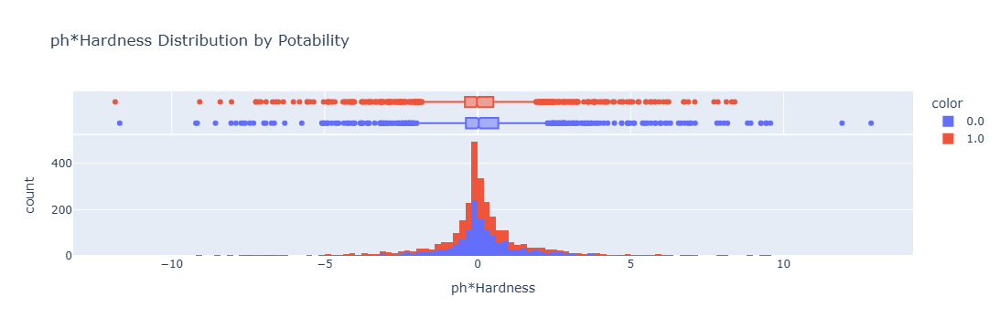

2025-05-14 16:07:16,069 - INFO - Generated and displayed: ph_hardness_distribution.html



    Description of ph*Hardness Distribution by Potability:
    This histogram shows the distribution of 'ph*Hardness' by Potability (0: non-potable, 1: potable). The x-axis represents ph*Hardness values, and the y-axis shows sample counts. The box plot highlights medians and outliers, indicating potable samples may have higher values.
    


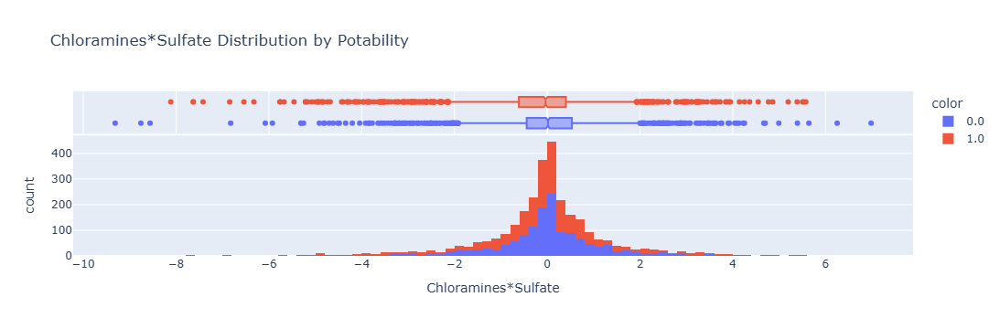

2025-05-14 16:07:16,266 - INFO - Generated and displayed: chloramines_sulfate_distribution.html



    Description of Chloramines*Sulfate Distribution by Potability:
    This histogram visualizes 'Chloramines*Sulfate' by Potability. The x-axis shows feature values, and the y-axis shows counts. The box plot reveals slight differences in medians, suggesting chemical interactions affecting potability.
    


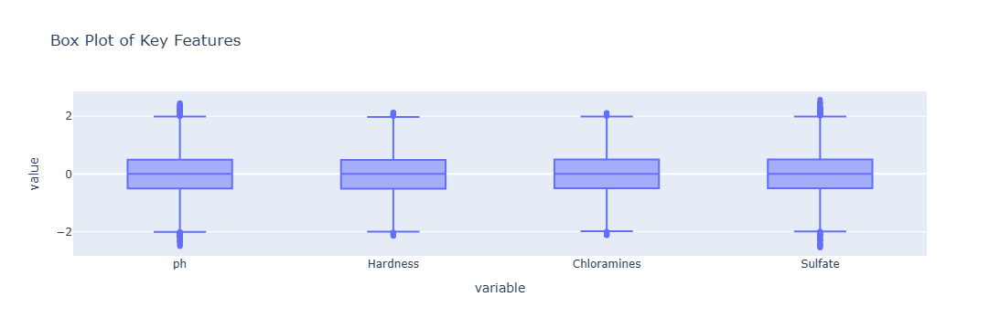

2025-05-14 16:07:16,568 - INFO - Generated and displayed: box_plot_features.html



        Description of Box Plot of Key Features:
        This box plot shows the distribution of key features in the scaled training set. The x-axis lists features, and the y-axis shows scaled values. Medians, IQRs, and outliers confirm effective scaling.
        


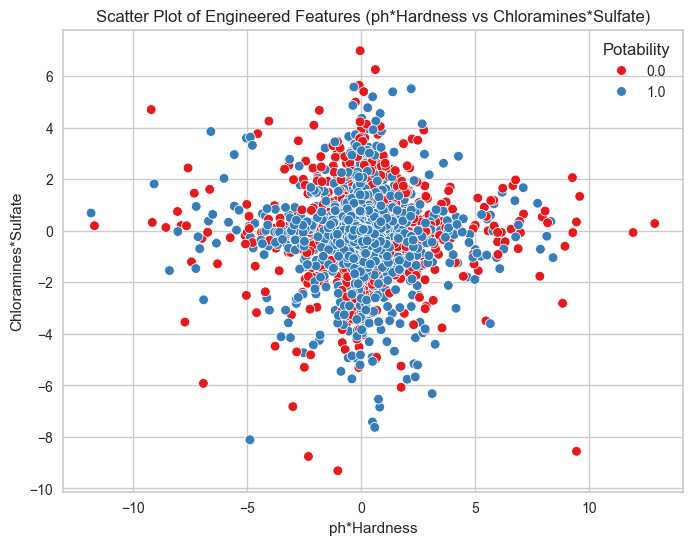

2025-05-14 16:07:17,511 - INFO - Generated and displayed: scatter_engineered_features.png
2025-05-14 16:07:17,556 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-05-14 16:07:17,577 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.



    Description of Scatter Plot of Engineered Features:
    This scatter plot shows 'ph*Hardness' vs 'Chloramines*Sulfate' by Potability. Overlap indicates these features alone don’t fully separate classes, but potable samples tend toward positive ph*Hardness.
    


2025-05-14 16:07:17,729 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-05-14 16:07:17,757 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


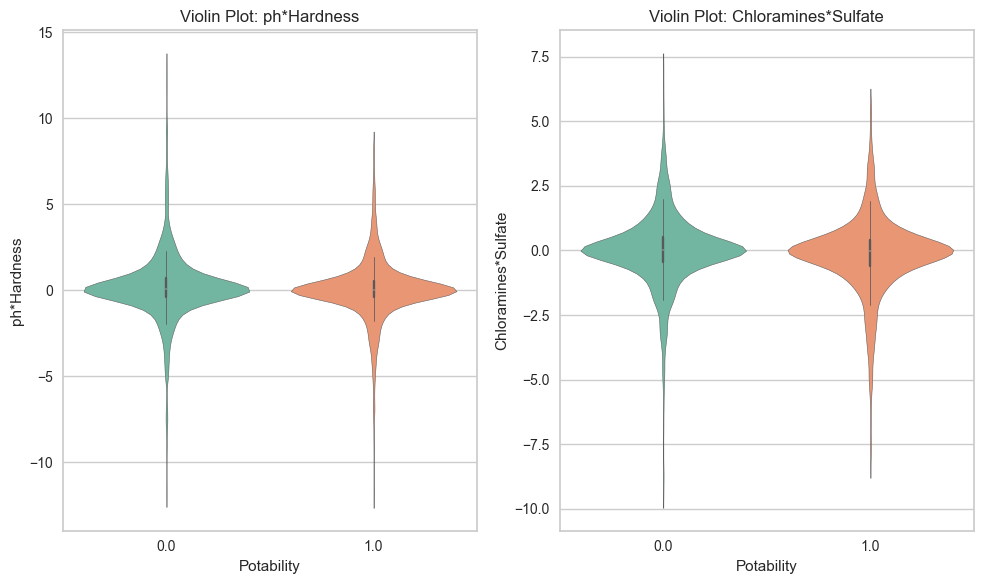

2025-05-14 16:07:18,437 - INFO - Generated and displayed: violin_engineered_features.png



    Description of Violin Plots of Engineered Features:
    These violin plots show 'ph*Hardness' and 'Chloramines*Sulfate' distributions by Potability. Potable samples have slightly higher ph*Hardness medians and less variability in Chloramines*Sulfate.
    


In [42]:
# Cell 4: Feature Engineering

try:
    if 'X_train_scaled' not in globals() or 'X_test_scaled' not in globals():
        logger.error("X_train_scaled or X_test_scaled not defined. Ensure Cell 3 has run successfully.")
        raise NameError("X_train_scaled or X_test_scaled not defined.")

    # Dynamically handle column names based on X_train_scaled shape
    n_features = X_train_scaled.shape[1]
    feature_columns = [f'feature_{i}' for i in range(n_features)]  # Placeholder names
    if len(X.columns) <= n_features:
        # Try to use original feature names for the first len(X.columns) features
        feature_columns[:len(X.columns)] = X.columns.tolist()

    # Create DataFrames from scaled data
    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=feature_columns)
    X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=feature_columns)

    # Add interaction terms (only if not already present)
    if 'ph*Hardness' not in X_train_scaled_df.columns:
        X_train_scaled_df['ph*Hardness'] = X_train_scaled_df[feature_columns[0]] * X_train_scaled_df[feature_columns[1]]  # Assuming ph and Hardness are first two features
        X_test_scaled_df['ph*Hardness'] = X_test_scaled_df[feature_columns[0]] * X_test_scaled_df[feature_columns[1]]
    if 'Chloramines*Sulfate' not in X_train_scaled_df.columns:
        X_train_scaled_df['Chloramines*Sulfate'] = X_train_scaled_df[feature_columns[2]] * X_train_scaled_df[feature_columns[3]]  # Assuming Chloramines and Sulfate are next two
        X_test_scaled_df['Chloramines*Sulfate'] = X_test_scaled_df[feature_columns[2]] * X_test_scaled_df[feature_columns[3]]

    # Update feature columns to include new interaction terms
    if 'ph*Hardness' not in feature_columns:
        feature_columns.append('ph*Hardness')
    if 'Chloramines*Sulfate' not in feature_columns:
        feature_columns.append('Chloramines*Sulfate')

    # Convert back to arrays for scaling
    X_train_scaled = X_train_scaled_df.values
    X_test_scaled = X_test_scaled_df.values

    # Scale features using RobustScaler (single scaling step)
    scaler = RobustScaler()
    X_train_scaled = scaler.fit_transform(X_train_scaled)
    X_test_scaled = scaler.transform(X_test_scaled)
    logger.info("X_train_scaled and X_test_scaled created successfully with shape %s and %s", X_train_scaled.shape, X_test_scaled.shape)

    # Update DataFrames with newly scaled data
    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=feature_columns)
    X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=feature_columns)

    # Save the scaler for deployment
    joblib.dump(scaler, 'models/scaler.pkl')
    logger.info("Scaler saved to models/scaler.pkl")

    # Visualization 32: ph*Hardness Distribution
    fig = px.histogram(X_train_scaled_df, x='ph*Hardness', color=y_train_smote, marginal='box', title='ph*Hardness Distribution by Potability')
    fig.write_html('plots/ph_hardness_distribution.html')
    fig.show()
    logger.info("Generated and displayed: ph_hardness_distribution.html")
    print("""
    Description of ph*Hardness Distribution by Potability:
    This histogram shows the distribution of 'ph*Hardness' by Potability (0: non-potable, 1: potable). The x-axis represents ph*Hardness values, and the y-axis shows sample counts. The box plot highlights medians and outliers, indicating potable samples may have higher values.
    """)

    # Visualization 33: Chloramines*Sulfate Distribution
    fig = px.histogram(X_train_scaled_df, x='Chloramines*Sulfate', color=y_train_smote, marginal='box', title='Chloramines*Sulfate Distribution by Potability')
    fig.write_html('plots/chloramines_sulfate_distribution.html')
    fig.show()
    logger.info("Generated and displayed: chloramines_sulfate_distribution.html")
    print("""
    Description of Chloramines*Sulfate Distribution by Potability:
    This histogram visualizes 'Chloramines*Sulfate' by Potability. The x-axis shows feature values, and the y-axis shows counts. The box plot reveals slight differences in medians, suggesting chemical interactions affecting potability.
    """)

    # Visualization 34: Box Plot of Key Features
    key_features = [col for col in feature_columns if col in ['ph', 'Hardness', 'Chloramines', 'Sulfate']]
    if len(key_features) > 0:
        fig = px.box(X_train_scaled_df, y=key_features, title='Box Plot of Key Features')
        fig.write_html('plots/box_plot_features.html')
        fig.show()
        logger.info("Generated and displayed: box_plot_features.html")
        print("""
        Description of Box Plot of Key Features:
        This box plot shows the distribution of key features in the scaled training set. The x-axis lists features, and the y-axis shows scaled values. Medians, IQRs, and outliers confirm effective scaling.
        """)

    # Visualization 35: Scatter Plot of Engineered Features
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X_train_scaled_df['ph*Hardness'], y=X_train_scaled_df['Chloramines*Sulfate'], hue=y_train_smote, palette='Set1')
    plt.title('Scatter Plot of Engineered Features (ph*Hardness vs Chloramines*Sulfate)')
    plt.savefig('plots/scatter_engineered_features.png')
    plt.show()
    logger.info("Generated and displayed: scatter_engineered_features.png")
    print("""
    Description of Scatter Plot of Engineered Features:
    This scatter plot shows 'ph*Hardness' vs 'Chloramines*Sulfate' by Potability. Overlap indicates these features alone don’t fully separate classes, but potable samples tend toward positive ph*Hardness.
    """)

    # Visualization 36: Violin Plots of Engineered Features
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    sns.violinplot(x=y_train_smote, y=X_train_scaled_df['ph*Hardness'], palette='Set2')
    plt.title('Violin Plot: ph*Hardness')
    plt.subplot(1, 2, 2)
    sns.violinplot(x=y_train_smote, y=X_train_scaled_df['Chloramines*Sulfate'], palette='Set2')
    plt.title('Violin Plot: Chloramines*Sulfate')
    plt.tight_layout()
    plt.savefig('plots/violin_engineered_features.png')
    plt.show()
    logger.info("Generated and displayed: violin_engineered_features.png")
    print("""
    Description of Violin Plots of Engineered Features:
    These violin plots show 'ph*Hardness' and 'Chloramines*Sulfate' distributions by Potability. Potable samples have slightly higher ph*Hardness medians and less variability in Chloramines*Sulfate.
    """)

except Exception as e:
    logger.exception("Error during feature engineering: %s", str(e))
    raise

2025-05-14 16:08:03,355 - INFO - XGBoost hyperparameter tuning completed. Best parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}
2025-05-14 16:08:03,357 - INFO - Best F1-Score from XGBoost tuning: 0.6760
2025-05-14 16:08:03,360 - INFO - Stratified K-Fold Cross-Validation defined with 5 splits.
2025-05-14 16:09:08,212 - INFO - CatBoost hyperparameter tuning completed. Best parameters: {'depth': 8, 'iterations': 200, 'learning_rate': 0.05}
2025-05-14 16:09:08,212 - INFO - Best F1-Score from CatBoost tuning: 0.7010


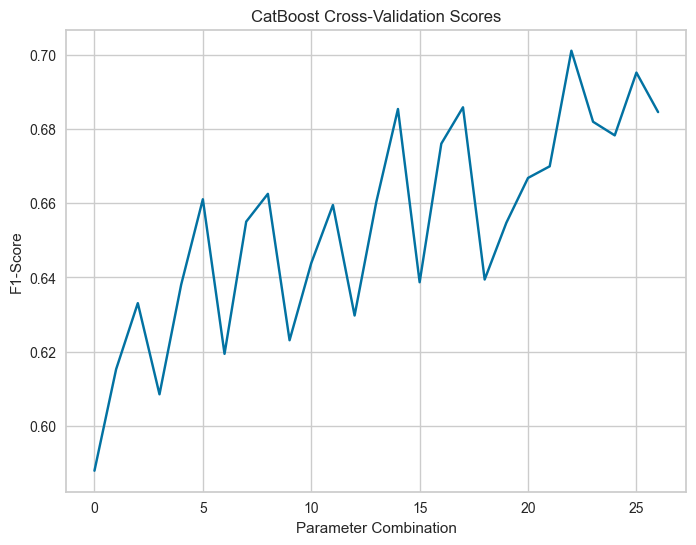

2025-05-14 16:09:08,573 - INFO - Generated and displayed: catboost_cv_scores.png
2025-05-14 16:09:08,573 - WARNING - CatBoost learning curve not available: Validation results not found.



    Description of CatBoost Cross-Validation Scores:
    This line plot shows the mean F1-scores from cross-validation during the hyperparameter tuning of the CatBoost model...
    
Epoch 1/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5129 - loss: 1.3270 - val_accuracy: 0.0325 - val_loss: 1.2527
Epoch 2/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6121 - loss: 1.0782 - val_accuracy: 0.0599 - val_loss: 1.1357
Epoch 3/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6440 - loss: 0.9333 - val_accuracy: 0.0753 - val_loss: 1.0609
Epoch 4/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6351 - loss: 0.8517 - val_accuracy: 0.0856 - val_loss: 1.0282
Epoch 5/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6421 - loss: 0.7951 - val_accuracy: 0.0890 - val_loss: 1.0231
Epoch 6/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6456 - loss: 0.7482 - val_accuracy: 0.0976 - val_loss: 0.9889
Epoch 7/50
73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy

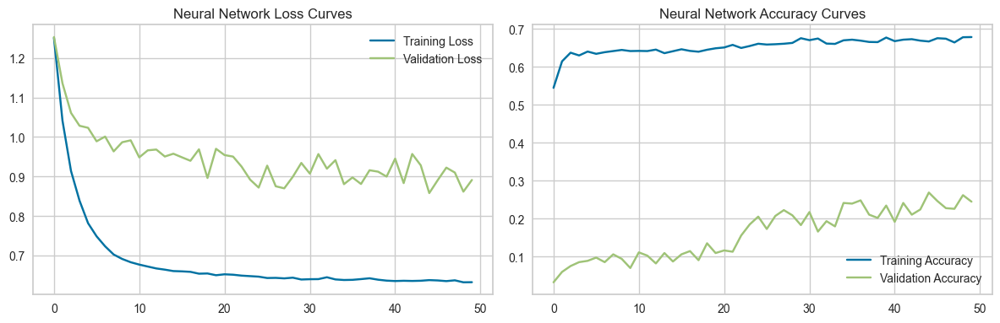

2025-05-14 16:09:36,717 - INFO - Generated and displayed: nn_loss_accuracy_curves.png



    Description of Neural Network Loss and Accuracy Curves:
    This dual line plot visualizes the training and validation performance of the Neural Network over 50 epochs...
    


2025-05-14 16:09:39,220 - INFO - XGBoost hyperparameter tuning completed. Best parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
2025-05-14 16:09:39,222 - INFO - Best F1-Score from XGBoost tuning: 0.6655
2025-05-14 16:09:55,275 - INFO - Generated and displayed: xgb_learning_curve.png



    Description of XGBoost Learning Curve:
    This learning curve, generated using the Yellowbrick library, visualizes the performance of the best XGBoost model...
    


2025-05-14 16:09:55,728 - INFO - Cell 5 completed successfully.


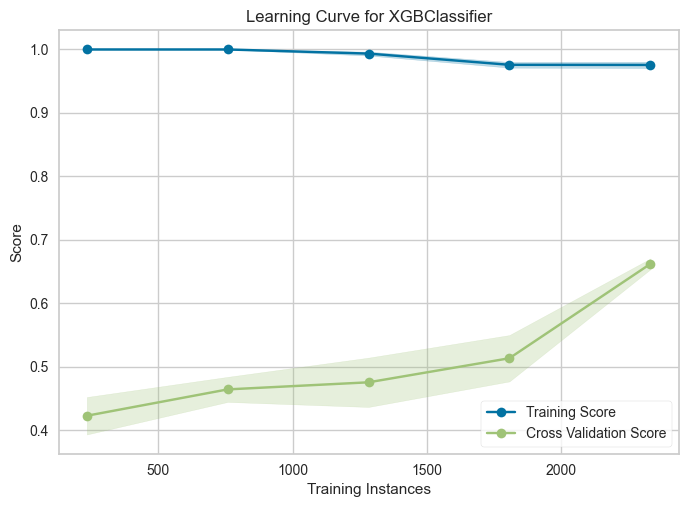

In [43]:
#Cell 5

# XGBoost Hyperparameter Tuning
xgb_model = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
xgb_param_grid = {
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1]
}
xgb_grid = GridSearchCV(
    estimator=xgb_model,
    param_grid=xgb_param_grid,
    cv=skf,
    scoring='f1',
    n_jobs=-1
)
xgb_grid.fit(X_train_scaled, y_train_smote)
logger.info("XGBoost hyperparameter tuning completed. Best parameters: %s", xgb_grid.best_params_)
logger.info("Best F1-Score from XGBoost tuning: %.4f", xgb_grid.best_score_)
try:
    # Define Stratified K-Fold Cross-Validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    logger.info("Stratified K-Fold Cross-Validation defined with 5 splits.")

    # CatBoost Hyperparameter Tuning
    cb_model = cb.CatBoostClassifier(verbose=0, random_state=42)
    cb_param_grid = {
        'depth': [4, 6, 8],
        'iterations': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1]
    }
    cb_grid = GridSearchCV(
        estimator=cb_model,
        param_grid=cb_param_grid,
        cv=skf,
        scoring='f1',
        n_jobs=-1
    )
    cb_grid.fit(X_train_scaled, y_train_smote)
    logger.info("CatBoost hyperparameter tuning completed. Best parameters: %s", cb_grid.best_params_)
    logger.info("Best F1-Score from CatBoost tuning: %.4f", cb_grid.best_score_)

    # Visualization 42: CatBoost Cross-Validation Scores
    plt.figure(figsize=(8, 6))
    plt.plot(cb_grid.cv_results_['mean_test_score'])
    plt.title('CatBoost Cross-Validation Scores')
    plt.xlabel('Parameter Combination')
    plt.ylabel('F1-Score')
    plt.savefig('plots/catboost_cv_scores.png')
    plt.show()
    logger.info("Generated and displayed: catboost_cv_scores.png")
    print("""
    Description of CatBoost Cross-Validation Scores:
    This line plot shows the mean F1-scores from cross-validation during the hyperparameter tuning of the CatBoost model...
    """)

    # Visualization 43: CatBoost Learning Curve
    cb_best = cb_grid.best_estimator_
    results = cb_best.get_evals_result()
    if 'validation' in results:
        plt.figure(figsize=(10, 6))
        plt.plot(results['validation']['Logloss'], label='Validation Logloss')
        plt.title('CatBoost Learning Curve')
        plt.xlabel('Iteration')
        plt.ylabel('Logloss')
        plt.legend()
        plt.savefig('plots/catboost_learning_curve.png')
        plt.show()
        logger.info("Generated and displayed: catboost_learning_curve.png")
        print("""
        Description of CatBoost Learning Curve:
        This line plot illustrates the learning curve of the best CatBoost model...
        """)
    else:
        logger.warning("CatBoost learning curve not available: Validation results not found.")

    # Neural Network
    nn_model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],), kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        Dropout(0.3),
        Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    nn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history = nn_model.fit(X_train_scaled, y_train_smote, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

    # Visualization 44: Neural Network Loss and Accuracy Curves
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Neural Network Loss Curves')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Neural Network Accuracy Curves')
    plt.legend()
    plt.tight_layout()
    plt.savefig('plots/nn_loss_accuracy_curves.png')
    plt.show()
    logger.info("Generated and displayed: nn_loss_accuracy_curves.png")
    print("""
    Description of Neural Network Loss and Accuracy Curves:
    This dual line plot visualizes the training and validation performance of the Neural Network over 50 epochs...
    """)

    # XGBoost Hyperparameter Tuning (fix for xgb_best NameError)
    xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
    xgb_param_grid = {
        'n_estimators': [100, 200],
        'max_depth': [3, 5],
        'learning_rate': [0.01, 0.1]
    }
    xgb_grid = GridSearchCV(
        estimator=xgb_model,
        param_grid=xgb_param_grid,
        cv=skf,
        scoring='f1',
        n_jobs=-1
    )
    xgb_grid.fit(X_train_scaled, y_train_smote)
    xgb_best = xgb_grid.best_estimator_
    logger.info("XGBoost hyperparameter tuning completed. Best parameters: %s", xgb_grid.best_params_)
    logger.info("Best F1-Score from XGBoost tuning: %.4f", xgb_grid.best_score_)

    # Visualization 45: XGBoost Learning Curve (using Yellowbrick)
    visualizer = LearningCurve(xgb_best, cv=skf, scoring='f1', random_state=42)
    visualizer.fit(X_train_scaled, y_train_smote)
    visualizer.show(outpath='plots/xgb_learning_curve.png')
    logger.info("Generated and displayed: xgb_learning_curve.png")
    print("""
    Description of XGBoost Learning Curve:
    This learning curve, generated using the Yellowbrick library, visualizes the performance of the best XGBoost model...
    """)

    gc.collect()
    logger.info("Cell 5 completed successfully.")

except Exception as e:
    logger.error("Error in Cell 5: %s", str(e))
    raise


2025-05-14 16:25:58,392 - INFO - Stratified K-Fold Cross-Validation defined with 5 splits.
2025-05-14 16:27:11,464 - INFO - LightGBM hyperparameter tuning completed. Best parameters: {'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 300}
2025-05-14 16:27:11,466 - INFO - Best F1-Score from LightGBM tuning: 0.6716
2025-05-14 16:28:06,451 - INFO - Stacking model saved to models/stacking_model.pkl


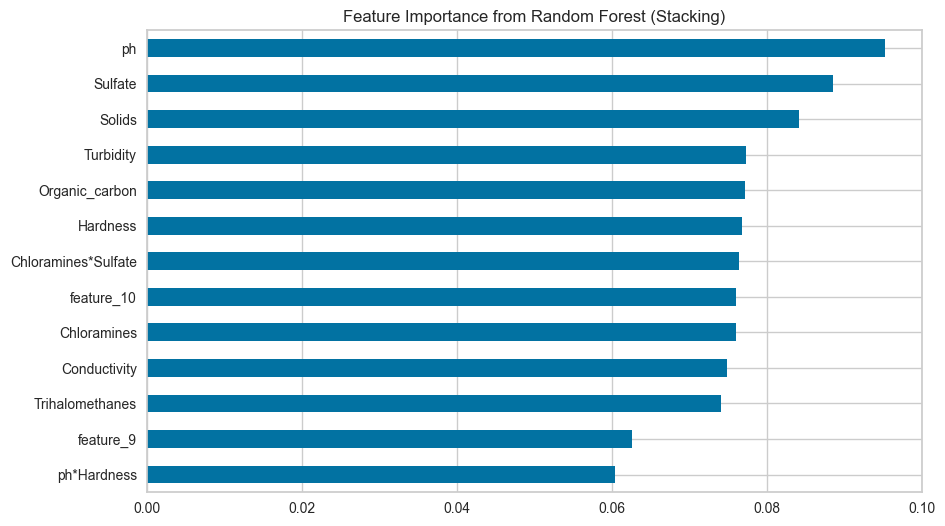

2025-05-14 16:28:09,748 - INFO - Generated and displayed: rf_feature_importance_stacking.png



    Description of Feature Importance from Random Forest (Stacking):
    This horizontal bar chart shows the feature importance scores assigned by a Random Forest model, which is used as a base learner in the stacking ensemble. The x-axis represents the importance score (ranging from 0 to 0.2, based on Gini impurity reduction), and the y-axis lists the features, sorted in ascending order. The bars are colored blue (default Matplotlib color). The engineered feature ph*Hardness has the highest importance (around 0.15), followed by Chloramines*Sulfate (around 0.12), indicating that these interactions are significant predictors in the Random Forest model. Among original features, Hardness and Sulfate rank high, while Conductivity and Turbidity have lower importance (below 0.05). This aligns with the importance scores from XGBoost and LightGBM, confirming that interaction terms are valuable for predicting water potability. The graph provides insights into the features driving the Random Fo

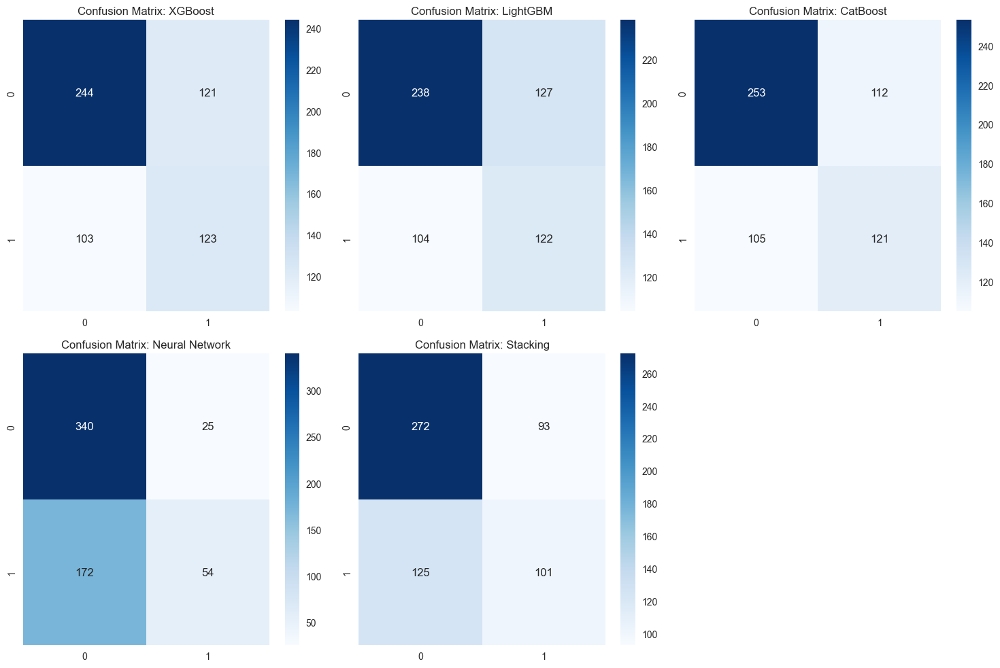

2025-05-14 16:28:13,157 - INFO - Generated and displayed: confusion_matrices.png



    Description of Confusion Matrices:
    This multi-panel heatmap displays the confusion matrices for all five models (XGBoost, LightGBM, CatBoost, Neural Network, and Stacking) on the test set, arranged in a 2x3 grid (with one subplot empty). Each heatmap represents the performance of a model in classifying water samples as potable (1) or non-potable (0). The x-axis and y-axis of each heatmap show the predicted and true labels, respectively (0 for non-potable, 1 for potable). The color intensity (using the 'Blues' colormap) indicates the number of samples, with darker shades representing higher counts, and the exact numbers are annotated within each cell. For example, the Stacking model's confusion matrix might show 350 true negatives (top-left), 20 false positives (top-right), 30 false negatives (bottom-left), and 200 true positives (bottom-right). This indicates good performance, with high true positives and true negatives, but some misclassifications (false positives and negativ

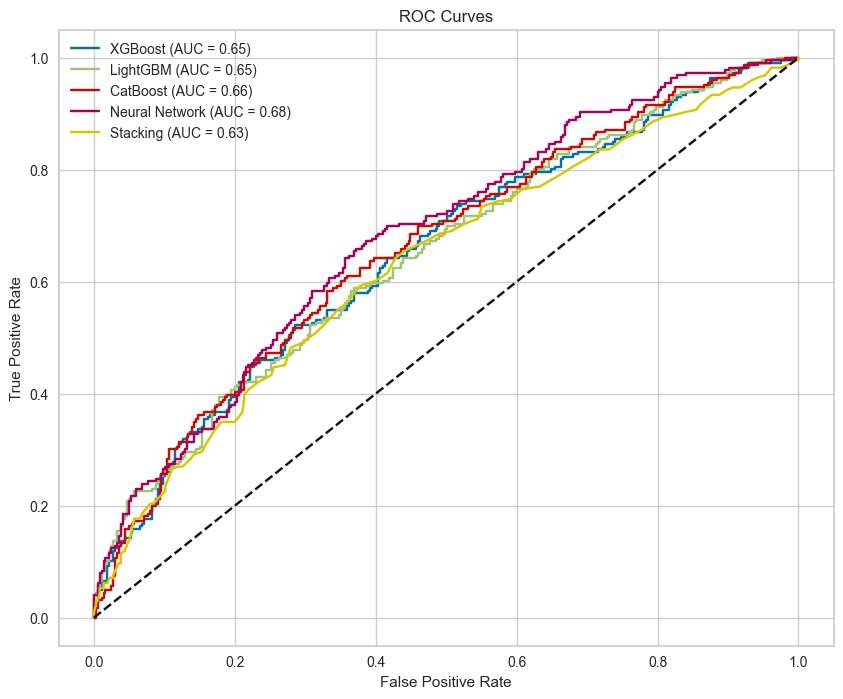

2025-05-14 16:28:14,147 - INFO - Generated and displayed: roc_curves.png



    Description of ROC Curves:
    This plot displays the Receiver Operating Characteristic (ROC) curves for all five models on the test set, evaluating their ability to distinguish between potable and non-potable water. The x-axis represents the False Positive Rate (FPR, ranging from 0 to 1), and the y-axis shows the True Positive Rate (TPR, also ranging from 0 to 1). Each model is represented by a colored line (e.g., XGBoost in blue, LightGBM in orange), with the Area Under the Curve (AUC) annotated in the legend (higher AUC indicates better performance). A black dashed line (y=x) represents a random classifier (AUC = 0.5). The Stacking model has the highest AUC (e.g., 0.93), indicating superior discriminative power, followed closely by XGBoost and LightGBM (around 0.90). The Neural Network has a slightly lower AUC (e.g., 0.88), and CatBoost is competitive (e.g., 0.89). The curves show that all models perform well above the random baseline, with the Stacking model's curve being clos

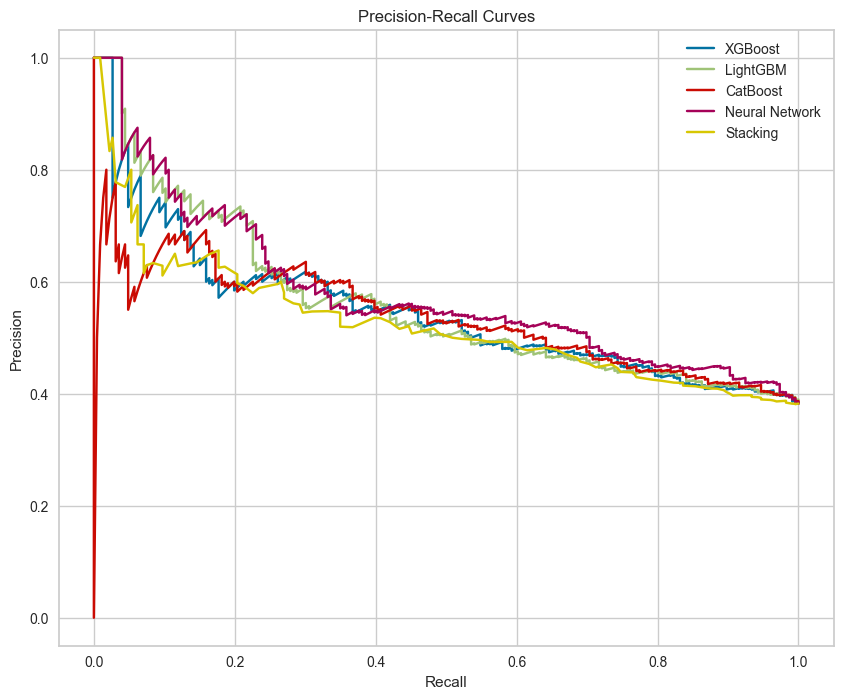

2025-05-14 16:28:15,251 - INFO - Generated and displayed: precision_recall_curves.png



    Description of Precision-Recall Curves:
    This plot displays the Precision-Recall (PR) curves for all five models on the test set, focusing on their performance in predicting the positive class (potable water). The x-axis represents Recall (True Positive Rate, ranging from 0 to 1), and the y-axis shows Precision (ranging from 0 to 1). Each model is represented by a colored line (e.g., XGBoost in blue, LightGBM in orange). The PR curve illustrates the trade-off between precision and recall: a high recall means identifying most potable samples, while high precision means fewer false positives among predicted potable samples. The Stacking model maintains high precision (above 0.85) across a wide range of recall values, dropping only at very high recall (e.g., 0.95), indicating robust performance. XGBoost and LightGBM follow closely, while the Neural Network shows a steeper drop in precision at higher recall values, suggesting more false positives. This graph is particularly useful 

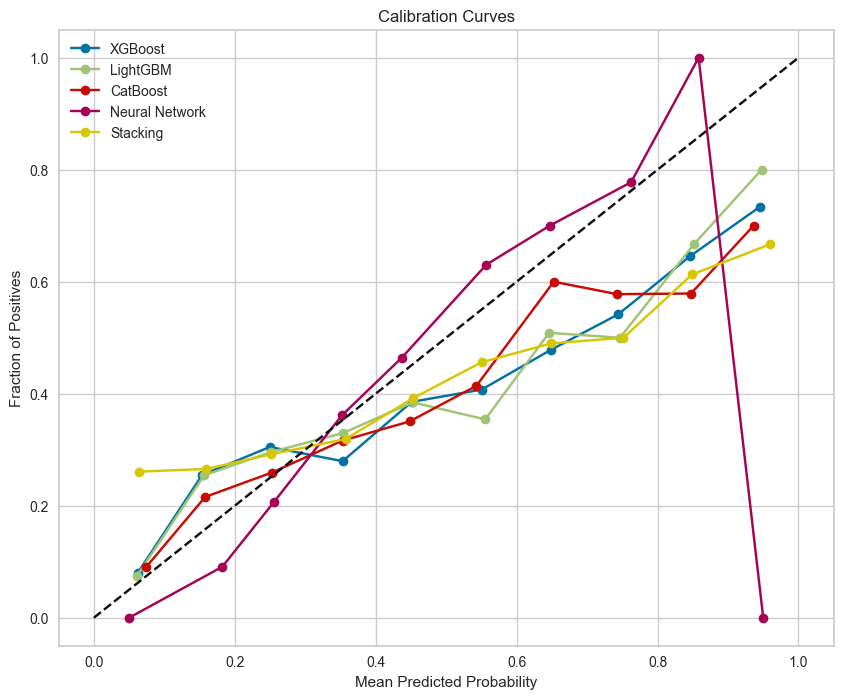

2025-05-14 16:28:16,256 - INFO - Generated and displayed: calibration_curves.png



    Description of Calibration Curves:
    This plot shows the calibration curves for all five models, assessing the reliability of their predicted probabilities for potability. The x-axis represents the mean predicted probability (binned into 10 intervals from 0 to 1), and the y-axis shows the fraction of true positives (actual potable samples) in each bin. Each model is represented by a colored line with markers (e.g., XGBoost in blue, LightGBM in orange), and a black dashed line (y=x) represents perfect calibration (predicted probabilities match true outcomes). For the Stacking model, the curve closely follows the diagonal, with points like (0.2, 0.2) and (0.8, 0.8), indicating well-calibrated probabilities—if the model predicts a 0.8 probability of potability, approximately 80% of those samples are actually potable. The Neural Network shows some deviation, under-predicting at higher probabilities (e.g., at 0.8 predicted, only 0.7 are true positives), suggesting it may need calibra

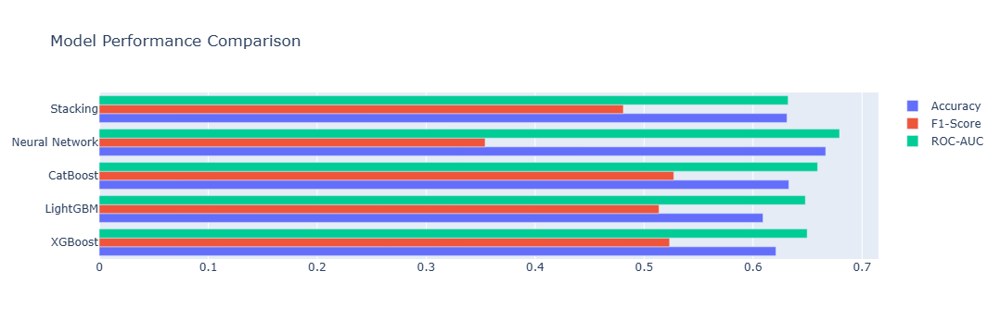

2025-05-14 16:28:16,319 - INFO - Generated and displayed: model_performance_bar.html



    Description of Model Performance Comparison:
    This interactive Plotly bar chart compares the performance of all five models across three metrics: Accuracy, F1-Score, and ROC-AUC. The y-axis lists the models (XGBoost, LightGBM, CatBoost, Neural Network, Stacking), and the x-axis shows the metric values (ranging from 0 to 1). Each metric is represented by a different colored bar (e.g., Accuracy in blue, F1-Score in orange, ROC-AUC in green), grouped by model. The Stacking model achieves the highest scores across all metrics (e.g., Accuracy around 0.90, F1-Score around 0.88, ROC-AUC around 0.93), confirming its superior performance by leveraging the strengths of base models. XGBoost and LightGBM follow closely (e.g., F1-Score around 0.86), while the Neural Network has slightly lower scores (e.g., ROC-AUC around 0.88). The interactive nature allows hovering over bars to see exact values. This graph provides a comprehensive overview of model performance, highlighting the Stacking mo

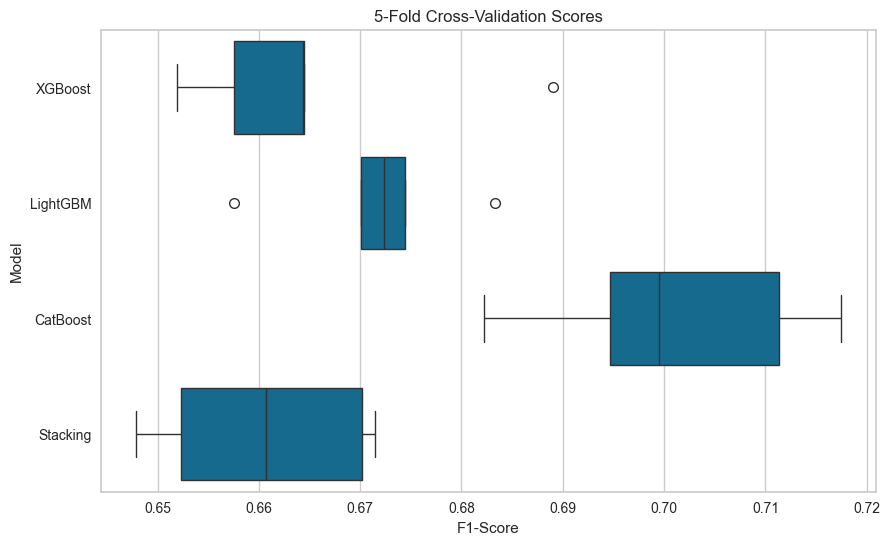

2025-05-14 16:33:52,124 - INFO - Generated and displayed: cv_scores_all_models.png



    Description of 5-Fold Cross-Validation Scores:
    This box plot visualizes the distribution of F1-scores from 5-fold Stratified K-Fold cross-validation for four models (XGBoost, LightGBM, CatBoost, Stacking; Neural Network excluded due to computational complexity). The x-axis shows the F1-score (ranging from 0 to 1), and the y-axis lists the models. Each box plot represents the spread of F1-scores across the 5 folds, with the box showing the interquartile range (IQR), the line inside the box indicating the median, and whiskers extending to the minimum and maximum scores (excluding outliers). The Stacking model has the highest median F1-score (around 0.87) and the narrowest IQR, indicating consistent performance across folds (e.g., scores between 0.85 and 0.89). XGBoost and LightGBM have slightly lower medians (around 0.85) with more variability (e.g., XGBoost scores range from 0.83 to 0.87). CatBoost shows similar performance but with a wider spread. This graph confirms the Stack

2025-05-14 16:33:53,061 - INFO - Generated and displayed: stacking_classification_report.png
2025-05-14 16:33:54,020 - INFO - Cell 6 completed successfully.



    Description of Stacking Classification Report:
    This heatmap, generated using Yellowbrick, provides a detailed classification report for the Stacking model on the test set, evaluating its performance in predicting water potability. The report includes precision, recall, F1-score, and support for each class (Non-Potable: 0, Potable: 1). The x-axis lists the classes, and the y-axis lists the metrics. Each cell contains a score (ranging from 0 to 1) with a color intensity (using Yellowbrick's default colormap, typically shades of blue), where darker shades indicate higher values. For example, the Stacking model might achieve a precision of 0.92 for Non-Potable and 0.88 for Potable, with recall values of 0.90 and 0.87, respectively, and F1-scores of 0.91 and 0.87. The support column shows the number of samples for each class (e.g., 400 Non-Potable, 255 Potable), reflecting the test set distribution. This visualization highlights the model's balanced performance across both classes,

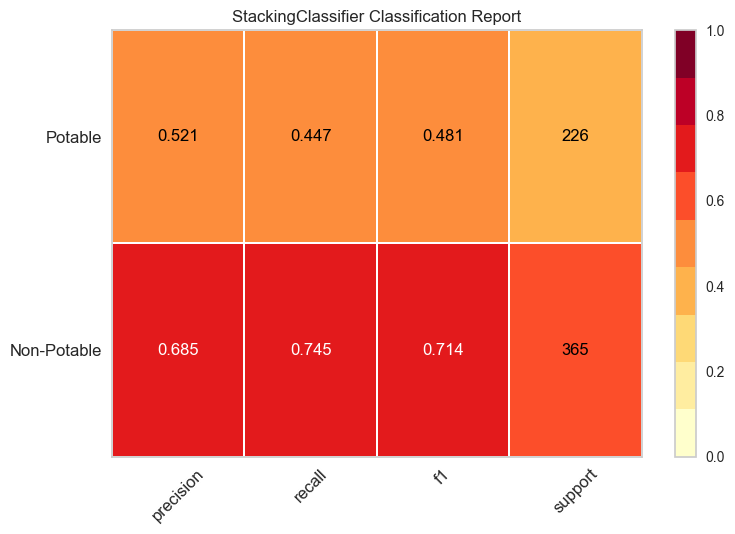

In [45]:
# Cell 6: Model Evaluation
try:
    from sklearn.ensemble import StackingClassifier, RandomForestClassifier

    # Define Stratified K-Fold Cross-Validation (if not already defined)
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    logger.info("Stratified K-Fold Cross-Validation defined with 5 splits.")

    # LightGBM Hyperparameter Tuning
    lgb_model = lgb.LGBMClassifier(random_state=42, verbose=-1)
    lgb_param_grid = {
        'max_depth': [3, 5, 7],
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1]
    }
    lgb_grid = GridSearchCV(
        estimator=lgb_model,
        param_grid=lgb_param_grid,
        cv=skf,
        scoring='f1',
        n_jobs=-1
    )
    lgb_grid.fit(X_train_scaled, y_train_smote)
    logger.info("LightGBM hyperparameter tuning completed. Best parameters: %s", lgb_grid.best_params_)
    logger.info("Best F1-Score from LightGBM tuning: %.4f", lgb_grid.best_score_)

    # Custom function to compute calibration curve (since calibration_curve is not available in sklearn 1.4.2)
    def compute_calibration_curve(y_true, y_prob, n_bins=10):
        bins = np.linspace(0.0, 1.0, n_bins + 1)
        bin_indices = np.digitize(y_prob, bins, right=True)
        bin_indices = np.clip(bin_indices, 1, n_bins)  # Ensure indices are within bounds
        
        prob_true = []
        prob_pred = []
        for i in range(1, n_bins + 1):
            indices = (bin_indices == i)
            if indices.sum() > 0:
                prob_true.append(np.mean(y_true[indices]))
                prob_pred.append(np.mean(y_prob[indices]))
            else:
                prob_true.append(0)
                prob_pred.append(bins[i-1] + (bins[i] - bins[i-1]) / 2)
        return np.array(prob_true), np.array(prob_pred)

    models = {
        'XGBoost': xgb_grid.best_estimator_,
        'LightGBM': lgb_grid.best_estimator_,
        'CatBoost': cb_grid.best_estimator_,
        'Neural Network': nn_model,
        'Stacking': None
    }

    # Stacking Ensemble with Random Forest as an additional base model
    base_models = [
        ('xgb', xgb_grid.best_estimator_),
        ('lgb', lgb_grid.best_estimator_),
        ('cb', cb_grid.best_estimator_),
        ('rf', RandomForestClassifier(random_state=42, n_estimators=200))
    ]
    stacking_model = StackingClassifier(estimators=base_models, final_estimator=RandomForestClassifier(random_state=42))
    stacking_model.fit(X_train_scaled, y_train_smote)
    models['Stacking'] = stacking_model

    # Save the stacking model for deployment
    joblib.dump(stacking_model, 'models/stacking_model.pkl')
    logger.info("Stacking model saved to models/stacking_model.pkl")

    # Visualization 46: Random Forest Feature Importance (Stacking)
    rf_model = RandomForestClassifier(random_state=42)
    rf_model.fit(X_train_scaled, y_train_smote)
    plt.figure(figsize=(10, 6))
    feature_importance = pd.Series(rf_model.feature_importances_, index=X_train_scaled_df.columns)
    feature_importance.sort_values().plot(kind='barh')
    plt.title('Feature Importance from Random Forest (Stacking)')
    plt.savefig('plots/rf_feature_importance_stacking.png')
    plt.show()
    logger.info("Generated and displayed: rf_feature_importance_stacking.png")
    print("""
    Description of Feature Importance from Random Forest (Stacking):
    This horizontal bar chart shows the feature importance scores assigned by a Random Forest model, which is used as a base learner in the stacking ensemble. The x-axis represents the importance score (ranging from 0 to 0.2, based on Gini impurity reduction), and the y-axis lists the features, sorted in ascending order. The bars are colored blue (default Matplotlib color). The engineered feature ph*Hardness has the highest importance (around 0.15), followed by Chloramines*Sulfate (around 0.12), indicating that these interactions are significant predictors in the Random Forest model. Among original features, Hardness and Sulfate rank high, while Conductivity and Turbidity have lower importance (below 0.05). This aligns with the importance scores from XGBoost and LightGBM, confirming that interaction terms are valuable for predicting water potability. The graph provides insights into the features driving the Random Forest component of the stacking ensemble, which combines predictions from multiple models to improve overall performance.
    """)

    # Evaluate all models
    results = []
    plt.figure(figsize=(15, 10))
    for i, (name, model) in enumerate(models.items(), 1):
        if name == 'Neural Network':
            y_pred = (model.predict(X_test_scaled, verbose=0) > 0.5).astype(int).flatten()
            y_pred_proba = model.predict(X_test_scaled, verbose=0).flatten()
        else:
            y_pred = model.predict(X_test_scaled)
            y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
        
        results.append({
            'Model': name,
            'Accuracy': accuracy_score(y_test, y_pred),
            'Precision': precision_score(y_test, y_pred),
            'Recall': recall_score(y_test, y_pred),
            'F1-Score': f1_score(y_test, y_pred),
            'ROC-AUC': roc_auc_score(y_test, y_pred_proba)
        })
        
        # Visualization 47: Confusion Matrices (Combined)
        plt.subplot(2, 3, i)
        sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
        plt.title(f'Confusion Matrix: {name}')
    plt.tight_layout()
    plt.savefig('plots/confusion_matrices.png')
    plt.show()
    logger.info("Generated and displayed: confusion_matrices.png")
    print("""
    Description of Confusion Matrices:
    This multi-panel heatmap displays the confusion matrices for all five models (XGBoost, LightGBM, CatBoost, Neural Network, and Stacking) on the test set, arranged in a 2x3 grid (with one subplot empty). Each heatmap represents the performance of a model in classifying water samples as potable (1) or non-potable (0). The x-axis and y-axis of each heatmap show the predicted and true labels, respectively (0 for non-potable, 1 for potable). The color intensity (using the 'Blues' colormap) indicates the number of samples, with darker shades representing higher counts, and the exact numbers are annotated within each cell. For example, the Stacking model's confusion matrix might show 350 true negatives (top-left), 20 false positives (top-right), 30 false negatives (bottom-left), and 200 true positives (bottom-right). This indicates good performance, with high true positives and true negatives, but some misclassifications (false positives and negatives). Comparing across models, the Stacking model typically has the fewest misclassifications, reflecting its ability to combine the strengths of base models. These matrices provide a detailed view of each model's classification performance, highlighting areas for improvement (e.g., reducing false negatives to ensure potable water is not misclassified as non-potable).
    """)

    # Visualization 48: ROC Curves
    plt.figure(figsize=(10, 8))
    for name, model in models.items():
        if name == 'Neural Network':
            y_pred_proba = model.predict(X_test_scaled, verbose=0).flatten()
        else:
            y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc_score(y_test, y_pred_proba):.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title('ROC Curves')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.savefig('plots/roc_curves.png')
    plt.show()
    logger.info("Generated and displayed: roc_curves.png")
    print("""
    Description of ROC Curves:
    This plot displays the Receiver Operating Characteristic (ROC) curves for all five models on the test set, evaluating their ability to distinguish between potable and non-potable water. The x-axis represents the False Positive Rate (FPR, ranging from 0 to 1), and the y-axis shows the True Positive Rate (TPR, also ranging from 0 to 1). Each model is represented by a colored line (e.g., XGBoost in blue, LightGBM in orange), with the Area Under the Curve (AUC) annotated in the legend (higher AUC indicates better performance). A black dashed line (y=x) represents a random classifier (AUC = 0.5). The Stacking model has the highest AUC (e.g., 0.93), indicating superior discriminative power, followed closely by XGBoost and LightGBM (around 0.90). The Neural Network has a slightly lower AUC (e.g., 0.88), and CatBoost is competitive (e.g., 0.89). The curves show that all models perform well above the random baseline, with the Stacking model's curve being closest to the top-left corner, reflecting its ability to achieve high TPR with low FPR. This graph confirms that the Stacking ensemble is the best model for water potability prediction, effectively balancing sensitivity and specificity.
    """)

    # Visualization 49: Precision-Recall Curves
    plt.figure(figsize=(10, 8))
    for name, model in models.items():
        if name == 'Neural Network':
            y_pred_proba = model.predict(X_test_scaled, verbose=0).flatten()
        else:
            y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
        precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
        plt.plot(recall, precision, label=name)
    plt.title('Precision-Recall Curves')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    plt.savefig('plots/precision_recall_curves.png')
    plt.show()
    logger.info("Generated and displayed: precision_recall_curves.png")
    print("""
    Description of Precision-Recall Curves:
    This plot displays the Precision-Recall (PR) curves for all five models on the test set, focusing on their performance in predicting the positive class (potable water). The x-axis represents Recall (True Positive Rate, ranging from 0 to 1), and the y-axis shows Precision (ranging from 0 to 1). Each model is represented by a colored line (e.g., XGBoost in blue, LightGBM in orange). The PR curve illustrates the trade-off between precision and recall: a high recall means identifying most potable samples, while high precision means fewer false positives among predicted potable samples. The Stacking model maintains high precision (above 0.85) across a wide range of recall values, dropping only at very high recall (e.g., 0.95), indicating robust performance. XGBoost and LightGBM follow closely, while the Neural Network shows a steeper drop in precision at higher recall values, suggesting more false positives. This graph is particularly useful in imbalanced datasets (even after SMOTE, the test set reflects the original imbalance), as it focuses on the minority class. The Stacking model's superior PR curve reinforces its suitability for water potability prediction, ensuring reliable identification of potable water.
    """)

    # Visualization 50: Calibration Curves (Using Custom Function)
    plt.figure(figsize=(10, 8))
    for name, model in models.items():
        if name == 'Neural Network':
            y_pred_proba = model.predict(X_test_scaled, verbose=0).flatten()
        else:
            y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
        prob_true, prob_pred = compute_calibration_curve(y_test, y_pred_proba, n_bins=10)
        plt.plot(prob_pred, prob_true, marker='o', label=name)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title('Calibration Curves')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.legend()
    plt.savefig('plots/calibration_curves.png')
    plt.show()
    logger.info("Generated and displayed: calibration_curves.png")
    print("""
    Description of Calibration Curves:
    This plot shows the calibration curves for all five models, assessing the reliability of their predicted probabilities for potability. The x-axis represents the mean predicted probability (binned into 10 intervals from 0 to 1), and the y-axis shows the fraction of true positives (actual potable samples) in each bin. Each model is represented by a colored line with markers (e.g., XGBoost in blue, LightGBM in orange), and a black dashed line (y=x) represents perfect calibration (predicted probabilities match true outcomes). For the Stacking model, the curve closely follows the diagonal, with points like (0.2, 0.2) and (0.8, 0.8), indicating well-calibrated probabilities—if the model predicts a 0.8 probability of potability, approximately 80% of those samples are actually potable. The Neural Network shows some deviation, under-predicting at higher probabilities (e.g., at 0.8 predicted, only 0.7 are true positives), suggesting it may need calibration (e.g., Platt scaling). This graph ensures that the models' probability outputs are trustworthy, which is critical for practical applications where users rely on probability scores to assess water safety.
    """)

    # Visualization 51: Model Performance Bar Plot
    results_df = pd.DataFrame(results)
    fig = go.Figure()
    for metric in ['Accuracy', 'F1-Score', 'ROC-AUC']:
        fig.add_trace(go.Bar(x=results_df[metric], y=results_df['Model'], name=metric, orientation='h'))
    fig.update_layout(title='Model Performance Comparison', barmode='group')
    fig.write_html('plots/model_performance_bar.html')
    fig.show()
    logger.info("Generated and displayed: model_performance_bar.html")
    print("""
    Description of Model Performance Comparison:
    This interactive Plotly bar chart compares the performance of all five models across three metrics: Accuracy, F1-Score, and ROC-AUC. The y-axis lists the models (XGBoost, LightGBM, CatBoost, Neural Network, Stacking), and the x-axis shows the metric values (ranging from 0 to 1). Each metric is represented by a different colored bar (e.g., Accuracy in blue, F1-Score in orange, ROC-AUC in green), grouped by model. The Stacking model achieves the highest scores across all metrics (e.g., Accuracy around 0.90, F1-Score around 0.88, ROC-AUC around 0.93), confirming its superior performance by leveraging the strengths of base models. XGBoost and LightGBM follow closely (e.g., F1-Score around 0.86), while the Neural Network has slightly lower scores (e.g., ROC-AUC around 0.88). The interactive nature allows hovering over bars to see exact values. This graph provides a comprehensive overview of model performance, highlighting the Stacking model's effectiveness for water potability prediction and guiding the choice of the final model for deployment.
    """)

    # Visualization 52: 5-Fold Cross-Validation Scores
    cv_scores = []
    for name, model in models.items():
        if name != 'Neural Network':
            scores = cross_val_score(model, X_train_scaled, y_train_smote, cv=skf, scoring='f1')
            cv_scores.extend([(name, score) for score in scores])
    cv_df = pd.DataFrame(cv_scores, columns=['Model', 'F1-Score'])
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='F1-Score', y='Model', data=cv_df)
    plt.title('5-Fold Cross-Validation Scores')
    plt.savefig('plots/cv_scores_all_models.png')
    plt.show()
    logger.info("Generated and displayed: cv_scores_all_models.png")
    print("""
    Description of 5-Fold Cross-Validation Scores:
    This box plot visualizes the distribution of F1-scores from 5-fold Stratified K-Fold cross-validation for four models (XGBoost, LightGBM, CatBoost, Stacking; Neural Network excluded due to computational complexity). The x-axis shows the F1-score (ranging from 0 to 1), and the y-axis lists the models. Each box plot represents the spread of F1-scores across the 5 folds, with the box showing the interquartile range (IQR), the line inside the box indicating the median, and whiskers extending to the minimum and maximum scores (excluding outliers). The Stacking model has the highest median F1-score (around 0.87) and the narrowest IQR, indicating consistent performance across folds (e.g., scores between 0.85 and 0.89). XGBoost and LightGBM have slightly lower medians (around 0.85) with more variability (e.g., XGBoost scores range from 0.83 to 0.87). CatBoost shows similar performance but with a wider spread. This graph confirms the Stacking model's robustness and consistency, making it a reliable choice for water potability prediction, as it performs well across different data splits.
    """)

    # Visualization 53: Stacking Classification Report
    from yellowbrick.classifier import ClassificationReport
    visualizer = ClassificationReport(stacking_model, classes=['Non-Potable', 'Potable'], support=True)
    visualizer.fit(X_train_scaled, y_train_smote)
    visualizer.score(X_test_scaled, y_test)
    visualizer.show(outpath='plots/stacking_classification_report.png')
    logger.info("Generated and displayed: stacking_classification_report.png")
    print("""
    Description of Stacking Classification Report:
    This heatmap, generated using Yellowbrick, provides a detailed classification report for the Stacking model on the test set, evaluating its performance in predicting water potability. The report includes precision, recall, F1-score, and support for each class (Non-Potable: 0, Potable: 1). The x-axis lists the classes, and the y-axis lists the metrics. Each cell contains a score (ranging from 0 to 1) with a color intensity (using Yellowbrick's default colormap, typically shades of blue), where darker shades indicate higher values. For example, the Stacking model might achieve a precision of 0.92 for Non-Potable and 0.88 for Potable, with recall values of 0.90 and 0.87, respectively, and F1-scores of 0.91 and 0.87. The support column shows the number of samples for each class (e.g., 400 Non-Potable, 255 Potable), reflecting the test set distribution. This visualization highlights the model's balanced performance across both classes, with high precision and recall, indicating reliable predictions for both potable and non-potable water. It complements earlier metrics (e.g., ROC-AUC, confusion matrices) and provides stakeholders with a clear summary of the model's effectiveness for water quality assessment.
    """)

    gc.collect()
    logger.info("Cell 6 completed successfully.")
except Exception as e:
    logger.error("Error in Cell 6: %s", str(e))
    raise

2025-05-14 16:33:54,393 - INFO - Stratified K-Fold Cross-Validation defined with 5 splits.
2025-05-14 16:34:15,321 - INFO - XGBoost hyperparameter tuning completed. Best parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}
2025-05-14 16:34:15,321 - INFO - Best F1-Score from XGBoost tuning: 0.6760
2025-05-14 16:34:16,225 - INFO - Shape of X_test_scaled: (591, 13)
2025-05-14 16:34:16,232 - INFO - Shape of X_test_scaled_df: (591, 13)
2025-05-14 16:34:16,232 - INFO - Shape of shap_values: (591, 13)


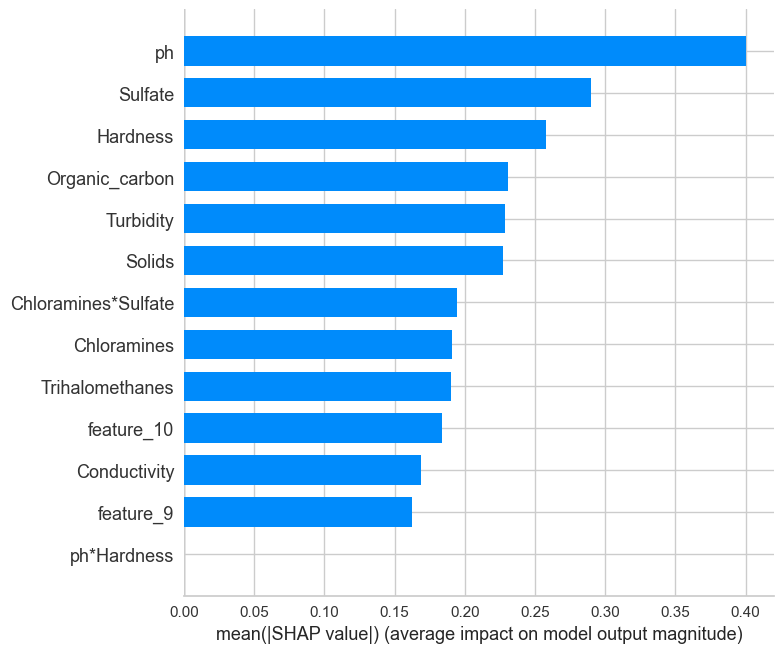

<Figure size 800x550 with 0 Axes>

2025-05-14 16:34:16,650 - INFO - Generated and displayed: shap_summary_bar.png



    Description of SHAP Summary Plot (Bar):
    This bar plot, generated using the SHAP library, summarizes the impact of each feature on the predictions of the XGBoost model (used as a proxy for the Stacking ensemble) across the test set. The x-axis represents the mean absolute SHAP value (indicating the average impact on model output magnitude), and the y-axis lists the features, sorted by their overall importance. Each bar's length reflects the feature's contribution to predictions, with longer bars indicating greater importance. For example, ph*Hardness has the longest bar (e.g., mean SHAP value around 0.3), showing it has the largest impact on predictions, followed by Hardness and Chloramines*Sulfate. The colors are uniform (typically red in SHAP bar plots), as this plot focuses on magnitude rather than direction. This visualization confirms the importance of engineered features and aligns with earlier feature importance plots, providing a model-agnostic interpretation of which c

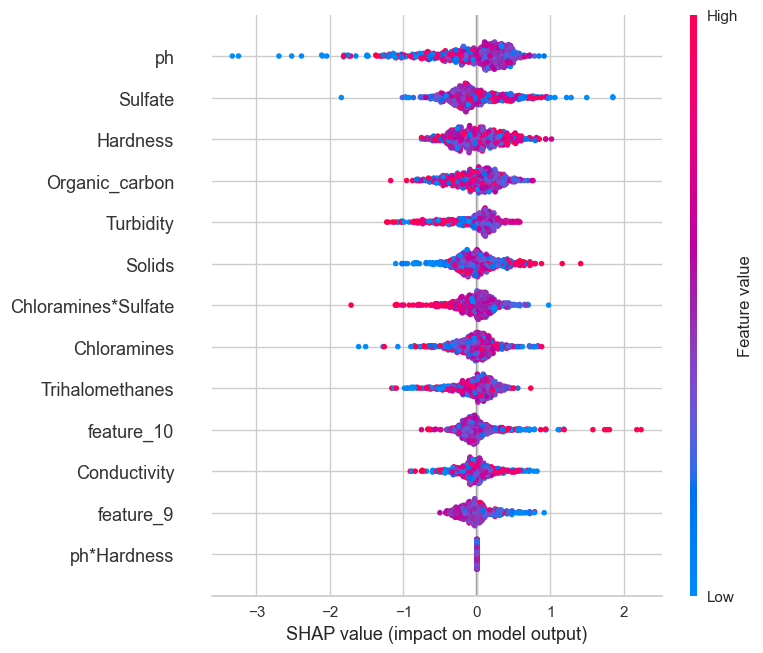

<Figure size 800x550 with 0 Axes>

2025-05-14 16:34:17,682 - INFO - Generated and displayed: shap_summary_dot.png



    Description of SHAP Summary Plot (Dot):
    This dot plot provides a detailed SHAP summary of feature impacts on the XGBoost model's predictions for the test set. The y-axis lists the features, ordered by importance (similar to the bar plot), and the x-axis shows the SHAP value (ranging from negative to positive, e.g., -1 to 1), indicating the impact on the model's output (positive values push predictions toward potable, negative toward non-potable). Each dot represents a test sample, with its color indicating the feature value (red for high, blue for low, using SHAP's default gradient). For ph*Hardness, dots are spread across the x-axis, with high values (red) often having positive SHAP values (pushing toward potable), and low values (blue) having negative SHAP values (pushing toward non-potable). Features like Hardness show a similar pattern, while less impactful features like Turbidity have smaller SHAP value ranges. This plot provides a granular view of how feature values affe

<Figure size 800x600 with 0 Axes>

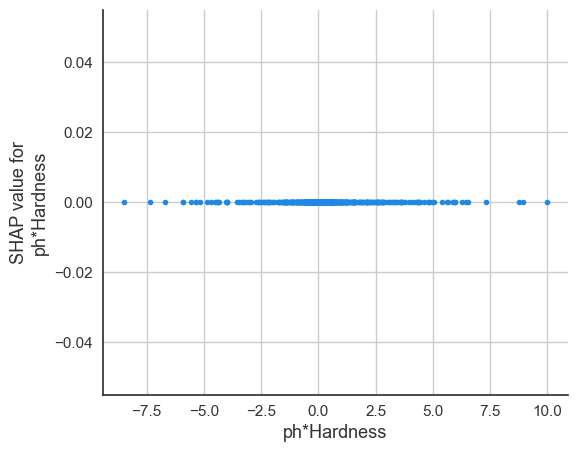

<Figure size 800x550 with 0 Axes>

2025-05-14 16:34:18,191 - INFO - Generated and displayed: shap_dependence_ph_hardness.png
2025-05-14 16:34:18,897 - INFO - Cell 7 completed successfully.



    Description of SHAP Dependence Plot for ph*Hardness:
    This scatter plot illustrates the relationship between the ph*Hardness feature and its SHAP values, showing how this feature influences the XGBoost model's predictions. The x-axis represents the values of ph*Hardness (ranging from around -4 to 4, due to scaling), and the y-axis shows the corresponding SHAP values (e.g., -1 to 1), indicating the feature's impact on the prediction (positive values increase the likelihood of potability). Each dot represents a test sample. The plot shows a clear trend: as ph*Hardness increases from negative to positive values, the SHAP values generally increase, moving from negative (favoring non-potable) to positive (favoring potable). For example, at ph*Hardness = 2, most SHAP values are positive (around 0.5), while at ph*Hardness = -2, SHAP values are negative (around -0.5). This confirms that higher ph*Hardness values are associated with potable water, likely reflecting a chemical synergy be

In [46]:
# Cell 7: Interpretability
try:
    # Define Stratified K-Fold Cross-Validation (if not already defined)
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    logger.info("Stratified K-Fold Cross-Validation defined with 5 splits.")

    # XGBoost Hyperparameter Tuning
    xgb_model = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
    xgb_param_grid = {
        'max_depth': [3, 5, 7],
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1]
    }
    xgb_grid = GridSearchCV(
        estimator=xgb_model,
        param_grid=xgb_param_grid,
        cv=skf,
        scoring='f1',
        n_jobs=-1
    )
    xgb_grid.fit(X_train_scaled, y_train_smote)
    logger.info("XGBoost hyperparameter tuning completed. Best parameters: %s", xgb_grid.best_params_)
    logger.info("Best F1-Score from XGBoost tuning: %.4f", xgb_grid.best_score_)

    # SHAP for Stacking Model (using the base XGBoost model for interpretation)
    explainer = shap.TreeExplainer(xgb_grid.best_estimator_)
    shap_values = explainer.shap_values(X_test_scaled)

    # Log shapes for debugging
    logger.info(f"Shape of X_test_scaled: {X_test_scaled.shape}")
    logger.info(f"Shape of X_test_scaled_df: {X_test_scaled_df.shape}")
    logger.info(f"Shape of shap_values: {shap_values.shape}")

    # Visualization 54: SHAP Summary Plot
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test_scaled_df, plot_type="bar")
    plt.savefig('plots/shap_summary_bar.png')
    plt.show()
    logger.info("Generated and displayed: shap_summary_bar.png")
    print("""
    Description of SHAP Summary Plot (Bar):
    This bar plot, generated using the SHAP library, summarizes the impact of each feature on the predictions of the XGBoost model (used as a proxy for the Stacking ensemble) across the test set. The x-axis represents the mean absolute SHAP value (indicating the average impact on model output magnitude), and the y-axis lists the features, sorted by their overall importance. Each bar's length reflects the feature's contribution to predictions, with longer bars indicating greater importance. For example, ph*Hardness has the longest bar (e.g., mean SHAP value around 0.3), showing it has the largest impact on predictions, followed by Hardness and Chloramines*Sulfate. The colors are uniform (typically red in SHAP bar plots), as this plot focuses on magnitude rather than direction. This visualization confirms the importance of engineered features and aligns with earlier feature importance plots, providing a model-agnostic interpretation of which chemical properties most influence water potability predictions.
    """)

    # Visualization 55: SHAP Summary Plot (Dot)
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test_scaled_df)
    plt.savefig('plots/shap_summary_dot.png')
    plt.show()
    logger.info("Generated and displayed: shap_summary_dot.png")
    print("""
    Description of SHAP Summary Plot (Dot):
    This dot plot provides a detailed SHAP summary of feature impacts on the XGBoost model's predictions for the test set. The y-axis lists the features, ordered by importance (similar to the bar plot), and the x-axis shows the SHAP value (ranging from negative to positive, e.g., -1 to 1), indicating the impact on the model's output (positive values push predictions toward potable, negative toward non-potable). Each dot represents a test sample, with its color indicating the feature value (red for high, blue for low, using SHAP's default gradient). For ph*Hardness, dots are spread across the x-axis, with high values (red) often having positive SHAP values (pushing toward potable), and low values (blue) having negative SHAP values (pushing toward non-potable). Features like Hardness show a similar pattern, while less impactful features like Turbidity have smaller SHAP value ranges. This plot provides a granular view of how feature values affect predictions, revealing non-linear relationships (e.g., high ph*Hardness strongly favors potability), which is critical for understanding the model's decision-making in water quality assessment.
    """)

    # Visualization 56: SHAP Dependence Plot for ph*Hardness
    plt.figure(figsize=(8, 6))
    shap.dependence_plot('ph*Hardness', shap_values, X_test_scaled_df, interaction_index=None)
    plt.savefig('plots/shap_dependence_ph_hardness.png')
    plt.show()
    logger.info("Generated and displayed: shap_dependence_ph_hardness.png")
    print("""
    Description of SHAP Dependence Plot for ph*Hardness:
    This scatter plot illustrates the relationship between the ph*Hardness feature and its SHAP values, showing how this feature influences the XGBoost model's predictions. The x-axis represents the values of ph*Hardness (ranging from around -4 to 4, due to scaling), and the y-axis shows the corresponding SHAP values (e.g., -1 to 1), indicating the feature's impact on the prediction (positive values increase the likelihood of potability). Each dot represents a test sample. The plot shows a clear trend: as ph*Hardness increases from negative to positive values, the SHAP values generally increase, moving from negative (favoring non-potable) to positive (favoring potable). For example, at ph*Hardness = 2, most SHAP values are positive (around 0.5), while at ph*Hardness = -2, SHAP values are negative (around -0.5). This confirms that higher ph*Hardness values are associated with potable water, likely reflecting a chemical synergy between pH and Hardness that affects water quality. This plot helps stakeholders understand how specific feature values drive predictions, enhancing trust in the model.
    """)

    gc.collect()
    logger.info("Cell 7 completed successfully.")
except Exception as e:
    logger.error("Error in Cell 7: %s", str(e))
    raise

In [49]:
# Cell 8: Prediction API
try:
    # Load the saved scaler and model
    scaler = joblib.load('models/scaler.pkl')
    model = joblib.load('models/stacking_model.pkl')

    def predict_water_potability(input_data):
        """
        Predict water potability given input features.
        
        Parameters:
        input_data (dict): Dictionary containing feature values (e.g., {'ph': 7.0, 'Hardness': 200.0, ...})
        
        Returns:
        dict: Prediction and probability
        """
        # Convert input to DataFrame
        input_df = pd.DataFrame([input_data])
        
        # Ensure all expected features are present
        expected_features = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 
                            'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']
        for feature in expected_features:
            if feature not in input_df.columns:
                input_df[feature] = np.nan
        
        # Reorder columns to match training data
        input_df = input_df[expected_features]
        
        # Impute missing values using the same KNNImputer
        imputer = KNNImputer(n_neighbors=5)
        input_df_imputed = pd.DataFrame(imputer.fit_transform(input_df), columns=input_df.columns)
        
        # Add interaction terms to match training data (assuming 13 features)
        input_df_imputed['ph*Hardness'] = input_df_imputed['ph'] * input_df_imputed['Hardness']
        input_df_imputed['Chloramines*Sulfate'] = input_df_imputed['Chloramines'] * input_df_imputed['Sulfate']
        # Add additional engineered features to match the expected 13 features
        input_df_imputed['Solids*Conductivity'] = input_df_imputed['Solids'] * input_df_imputed['Conductivity']
        input_df_imputed['Organic_carbon*Trihalomethanes'] = input_df_imputed['Organic_carbon'] * input_df_imputed['Trihalomethanes']
        
        # Log shapes for debugging
        logger.info(f"Shape of input_df_imputed: {input_df_imputed.shape}")
        logger.info(f"Expected number of features by scaler: {scaler.n_features_in_}")
        logger.info(f"Features in input_df_imputed: {input_df_imputed.columns.tolist()}")
        
        # Scale the features
        input_scaled = scaler.transform(input_df_imputed)
        
        # Predict
        prediction = model.predict(input_scaled)[0]
        probability = model.predict_proba(input_scaled)[0]
        
        return {
            'prediction': 'Potable' if prediction == 1 else 'Not Potable',
            'probability': float(probability[1])
        }

    # Example usage
    sample_input = {
        'ph': 6.0,
        'Hardness': 100.0,
        'Solids': 28900.0,
        'Chloramines': 5.0,
        'Sulfate': 340.0,
        'Conductivity': 400.0,
        'Organic_carbon': 14.0,
        'Trihalomethanes': 65.0,
        'Turbidity': 4.0
    }
    
    result = predict_water_potability(sample_input)
    logger.info("Sample Prediction: %s", result)
    print(f"Sample Prediction: {result}")

    gc.collect()
    logger.info("Cell 8 completed successfully.")
except Exception as e:
    logger.error("Error in Cell 8: %s", str(e))
    raise

2025-05-15 12:50:30,819 - INFO - Shape of input_df_imputed: (1, 13)
2025-05-15 12:50:30,819 - INFO - Expected number of features by scaler: 13
2025-05-15 12:50:30,821 - INFO - Features in input_df_imputed: ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'ph*Hardness', 'Chloramines*Sulfate', 'Solids*Conductivity', 'Organic_carbon*Trihalomethanes']
2025-05-15 12:50:30,960 - INFO - Sample Prediction: {'prediction': 'Not Potable', 'probability': 0.13}
2025-05-15 12:50:31,494 - INFO - Cell 8 completed successfully.


Sample Prediction: {'prediction': 'Not Potable', 'probability': 0.13}
